In [31]:
%load_ext autoreload
%autoreload 2

import PolyBin3D as pb  # the main code
import numpy as np
import h5py
import matplotlib.pyplot as plt
from os.path import join, exists
import os
import matplotlib as mpl
mpl.style.use('style.mcstyle')

os.chdir('/home/x-mho1/git/ltu-cmass-run')

from astropy.cosmology import Planck18 as cosmo

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


OSError: 'style.mcstyle' is not a valid package style, path of style file, URL of style file, or library style name (library styles are listed in `style.available`)

In [ ]:
wdir = '/anvil/scratch/x-mho1/cmass-ili'

## Manual tests

In [3]:
filename = '/anvil/scratch/x-mho1/cmass-ili/quijotelike/fastpm_polybin/L1000-N128/663/galaxies/hod00001.h5'
a = '0.666667'
with h5py.File(filename, 'r') as f:
    pos, vel = f[a]['pos'][:], f[a]['vel'][:]

Lbox = 1000
Nbox = 128
MAS = 'TSC'

FileNotFoundError: [Errno 2] Unable to synchronously open file (unable to open file: name = '/anvil/scratch/x-mho1/cmass-ili/quijotelike/fastpm_polybin/L1000-N128/663/galaxies/hod00001.h5', errno = 2, error message = 'No such file or directory', flags = 0, o_flags = 0)

In [ ]:
delta = Lbox/Nbox
pos += np.random.uniform(-delta/2, delta/2, size=pos.shape)

In [ ]:

import redshift_space_library as RSL
import MAS_library as MASL


def MA(pos, L, N, MAS='CIC'):
    pos = np.ascontiguousarray(pos)
    delta = np.zeros((N, N, N), dtype=np.float32)
    pos %= L
    MASL.MA(pos, delta, BoxSize=L, MAS=MAS)
    delta = delta.astype(np.float64)
    delta /= np.mean(delta)
    delta -= 1
    return delta


def MAz(pos, vel, L, N, cosmo, z, MAS='CIC', axis=0):
    pos, vel = map(np.ascontiguousarray, (pos, vel))
    RSL.pos_redshift_space(pos, vel, L, cosmo.H(z).value/cosmo.h, z, axis)
    return MA(pos, L, N, MAS)

In [230]:

# field = MA(pos, Lbox, Nbox, MAS)
field = MAz(pos, vel, Lbox, Nbox, cosmo, 0.5, MAS, axis=2)

In [231]:
# # Define fiducial power spectrum (assuming the Kaiser formula)
# k_arr = np.arange(0.001, 1., 0.001)
# Plin_arr = Plin(k_arr)
# P0_arr = (b1**2 + 2./3.*b1*fz + 1./5.*fz**2.)*Plin_arr+1./nbar
# P2_arr = (4./3.*b1*fz + 4./7.*fz**2.)*Plin_arr
# P4_arr = 8./35.*fz**2*Plin_arr
# Pk_theory = [k_arr, P0_arr, P2_arr, P4_arr]

# # Define weighting, only using the monopole
# Pk_fiducial = [k_arr, P0_arr]
boxsize = [Lbox]*3  # size of the simulation volume
gridsize = [Nbox]*3  # grid size for computing the density field

# Load the PolyBin3D class using the fiducial power spectrum
base = pb.PolyBin3D(
    boxsize, gridsize, None,
    boxcenter=[0]*3,  # center of the simulation volume
    pixel_window=MAS.lower(),  # pixel window function
    # backend for performing FFTs ('mkl' or 'fftw' for cpu, 'jax' for gpu)
    backend='fftw',
    # number of CPUs for performing FFTs (does not apply to jax computations)
    nthreads=1,
    # line-of-sight [global = z-axis, local = relative to pair]
    sightline='global',
)


# Dimensions: [1.00e+03, 1.00e+03, 1.00e+03] Mpc/h
# Center: [0.00e+00, 0.00e+00, 0.00e+00] Mpc/h
# Line-of-sight: global
# Cartesian grid: [128, 128, 128]
# Fundamental frequency: [0.0063, 0.0063, 0.0063] h/Mpc
# Nyquist frequency: [0.402, 0.402, 0.402] h/Mpc
# Pixel window: tsc
# Using FFTW backend


In [232]:
# Define some k-bins and ell_max
kmin = 2*np.pi/Lbox
kmax = Nbox*np.pi/Lbox
k_edges = np.arange(kmin, kmax, 2*kmin)
lmax = 4

# Load the power spectrum class
pspec = pb.PSpec(base, k_edges, lmax=lmax, applySinv=None, mask=None)


Binning: 31 bins in [0.006, 0.396] h/Mpc
l-max: 4
Mask: constant


In [233]:
pk = pspec.Pk_ideal(field, discreteness_correction=True)

# Define the k-bin centers
k_cen = pspec.get_ks()

# Print number of FFTs used for diagnostics
print("\nComputations complete using %d forward and %d reverse FFTs" %
      (base.n_FFTs_forward, base.n_FFTs_reverse))

Computing ideal Fisher matrix



Computations complete using 1 forward and 0 reverse FFTs


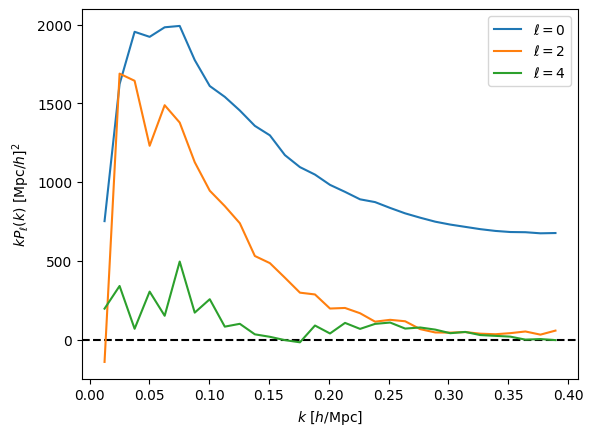

In [234]:
plt.axhline(0, color='k', ls='--')
for ell in range(0, 3):
    ell *= 2
    plt.plot(k_cen, k_cen*pk[f'p{ell}'], label=f'$\ell={ell}$')
plt.xlabel(r'$k\ [h/\mathrm{Mpc}]$')
plt.ylabel(r'$k P_\ell(k)\ [\mathrm{Mpc}/h]^2$')
plt.legend()

In [235]:


# Define some k-bins and ell_max
k_edges = np.arange(kmin, kmax, 5*kmin)
lmax = 2

# Load the bispectrum class
bspec = pb.BSpec(
    base,
    k_edges,  # one-dimensional bin edges
    # weighting function [only used in unwindowed estimators]
    applySinv=None,
    mask=None,  # real-space mask
    lmax=lmax,  # maximum Legendre multipole
    k_bins_squeeze=None,  # squeezed bins
    # whether to include bins whose centers do not satisfy triangle conditions
    include_partial_triangles=False,
    # use the same P_fid as the base class. If Pk_fid = None, we don't apply any weighting.
    Pk_fid='default',
)


Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
N_bins: 406
Mask: constant


In [236]:
# # Plot k-bins
k123 = bspec.get_ks()
# for i in range(3):
#     plt.plot(k123[i], label=r'$k_%d$' % (i+1))
# plt.legend(fontsize=15)
# plt.xlabel(r'Bin Index', fontsize=15)
# plt.ylabel(r'$k_i$', fontsize=15)

In [237]:
# Compute the ideal bispectrum with and without the discretess correction
bk_corr = bspec.Bk_ideal(field, discreteness_correction=True)
# bk_uncorr = bspec.Bk_ideal(field, discreteness_correction=False)

# Print number of FFTs used for diagnostics
print("\nComputations complete using %d forward and %d reverse FFTs" %
      (base.n_FFTs_forward, base.n_FFTs_reverse))

Computing degeneracy factor


Computing ideal Fisher matrix

Computations complete using 2 forward and 156 reverse FFTs


Text(0.5, 1.0, 'Discreteness-Corrected (lines) vs Discreteness-Uncorrected (dashes)')

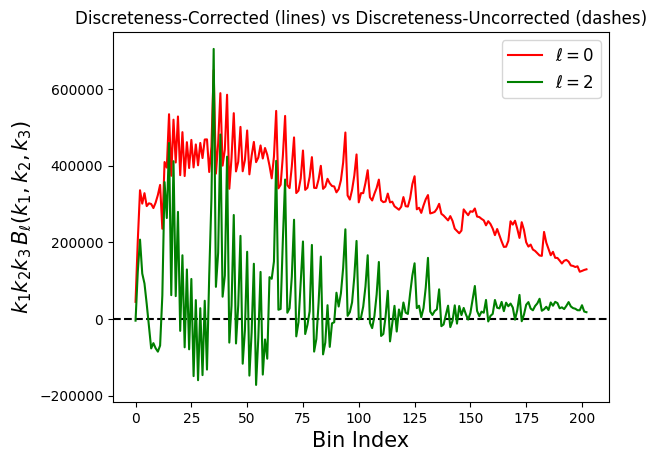

In [238]:
cs = ['r', 'g']
weight = k123.prod(axis=0)
plt.axhline(0, color='k', ls='--')
for l in range(0, lmax+1, 2):
    plt.plot(weight*bk_corr['b%d' % l], c=cs[l//2], label=r'$\ell=%d$' % l)
    # plt.plot(weight*bk_uncorr['b%d' % l], c=cs[l//2], ls='--')
plt.xlabel(r'Bin Index', fontsize=15)
plt.ylabel(r'$k_1k_2k_3\,B_\ell(k_1,k_2,k_3)$', fontsize=15)
plt.legend(fontsize=12)
plt.title(
    'Discreteness-Corrected (lines) vs Discreteness-Uncorrected (dashes)', fontsize=12)

In [187]:
# # (Re)compute the ideal Fisher matrix with and without the discretess correction
# fish_ideal_corr = bspec.compute_fisher_ideal(discreteness_correction=True)
# fish_ideal_uncorr = bspec.compute_fisher_ideal(discreteness_correction=False)

# for l in range(0, lmax+1, 2):
#     plt.plot(np.diag(fish_ideal_corr)[
#              l//2*bspec.N3:(l//2+1)*bspec.N3], c=cs[l//2], label=r'$\ell=%d$' % l)
#     plt.plot(np.diag(fish_ideal_uncorr)[
#              l//2*bspec.N3:(l//2+1)*bspec.N3], c=cs[l//2])
# plt.xlabel(r'Bin Index', fontsize=15)
# plt.ylabel(r'Fisher Diagonal', fontsize=15)
# plt.legend(fontsize=13)
# plt.yscale('log')
# plt.xlim(0, bspec.N3-1)

# # Plot correlation matrix
# plot_corr(fish_ideal_corr, subtract_identity=False,
#           v=1e-7, title='With Correction')
# plot_corr(fish_ideal_uncorr, subtract_identity=False,
#           v=1e-7, title='Without Correction')

## Check outputs

In [75]:
file = '/anvil/scratch/x-mho1/cmass-ili/quijotelike/fastpm_polybin/L1000-N128/663/diag/galaxies/hod00001.h5'
a = '0.666667'
out = {}
with h5py.File(file, 'r') as f:
    out = {key: f[a][key][()] for key in f[a].keys()}

In [76]:
out.keys()
# x.shape

dict_keys(['Bk', 'Bk_k123', 'Pk', 'Pk_k3D', 'Qk', 'bPk', 'bPk_k3D', 'zBk', 'zBk_k123', 'zPk', 'zPk_k3D', 'zQk', 'zbPk', 'zbPk_k3D'])

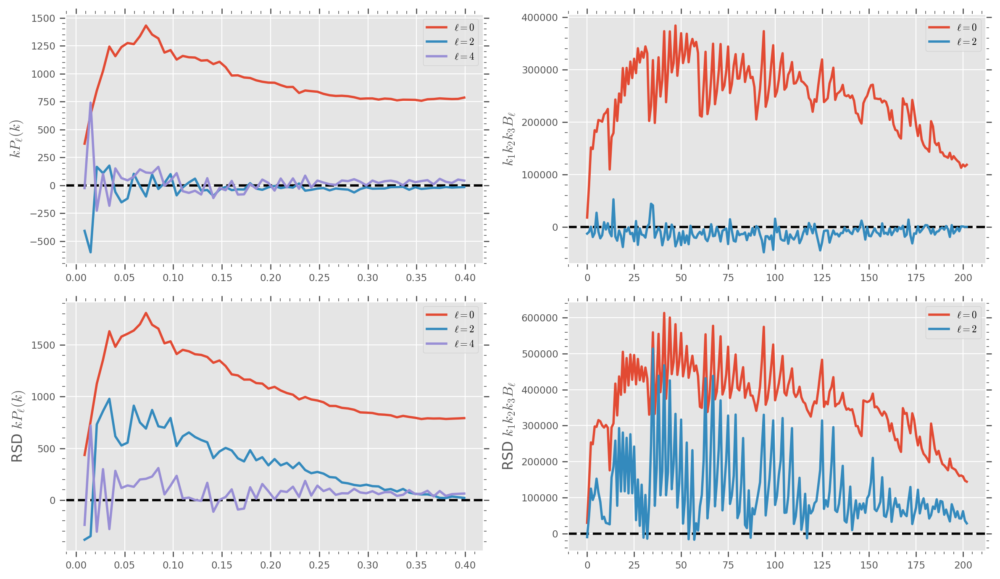

In [77]:
f, axs = plt.subplots(2, 2, figsize=(12, 7))
axs = axs.flatten()

ax = axs[0]
ax.axhline(0, color='k', ls='--')
x, y = out['Pk_k3D'], out['Pk']
m = x < 0.4
x, y = x[m], y[m]
for i in range(3):
    ax.plot(x, x*y[:, i], label=r'$\ell=%d$' % (i*2))
ax.set_ylabel(r'$k P_\ell(k)$')
ax.legend()

ax = axs[1]
ax.axhline(0, color='k', ls='--')
x, y = out['Bk_k123'], out['Bk']
for i in range(2):
    ax.plot(np.prod(x, axis=0)*y[i], label=r'$\ell=%d$' % (i*2))
ax.set_ylabel(r'$k_1 k_2 k_3 B_\ell$')
ax.legend()

ax = axs[2]
ax.axhline(0, color='k', ls='--')
x, y = out['zPk_k3D'], out['zPk']
m = x < 0.4
x, y = x[m], y[m]
for i in range(3):
    ax.plot(x, x*y[:, i], label=r'$\ell=%d$' % (i*2))
ax.set_ylabel(r'RSD $k P_\ell(k)$')
ax.legend()

ax = axs[3]
ax.axhline(0, color='k', ls='--')
x, y = out['zBk_k123'], out['zBk']
for i in range(2):
    ax.plot(np.prod(x, axis=0)*y[i], label=r'$\ell=%d$' % (i*2))
ax.set_ylabel(r'RSD $k_1 k_2 k_3 B_\ell$')
ax.legend()
plt.tight_layout()

## Check inference

#### Baseline

In [32]:
# Baseline
nbody = 'quijotelike'
sim = 'fastpm_4k'
tracer = 'galaxy'
postfix = 'kmin-0.0_kmax-0.4'
summlist = ['nbar', 'zPk0', 'zPk2', 'zPk4', 'zBk0']
summaries = '+'.join(summlist)
modeldir = join(wdir, nbody, sim, 'models', tracer, summaries, postfix)

nbar = np.load(join(modeldir, 'x_test.npy'))[:, -1]

Study name: nbar+zPk0+zPk2+zPk4+zBk0
Number of trials: 237


/tmp/ipykernel_2865791/1636650359.py:13: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  optuna.visualization.matplotlib.plot_optimization_history(study)
/tmp/ipykernel_2865791/1636650359.py:14: ExperimentalWarning: optuna.visualization.matplotlib._param_importances.plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  optuna.visualization.matplotlib.plot_param_importances(study)


<Axes: title={'left': 'Hyperparameter Importances'}, xlabel='Hyperparameter Importance', ylabel='Hyperparameter'>

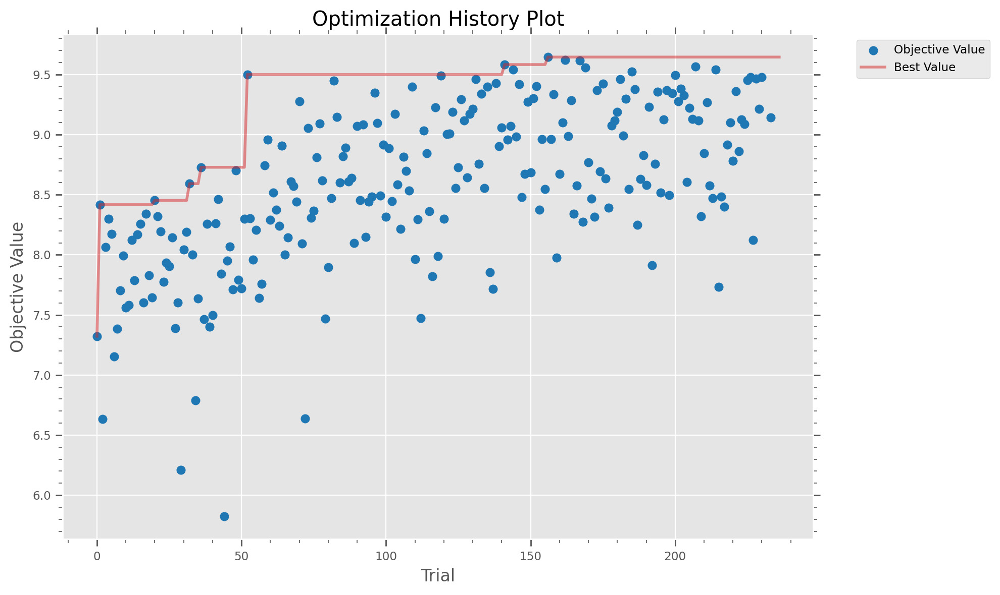

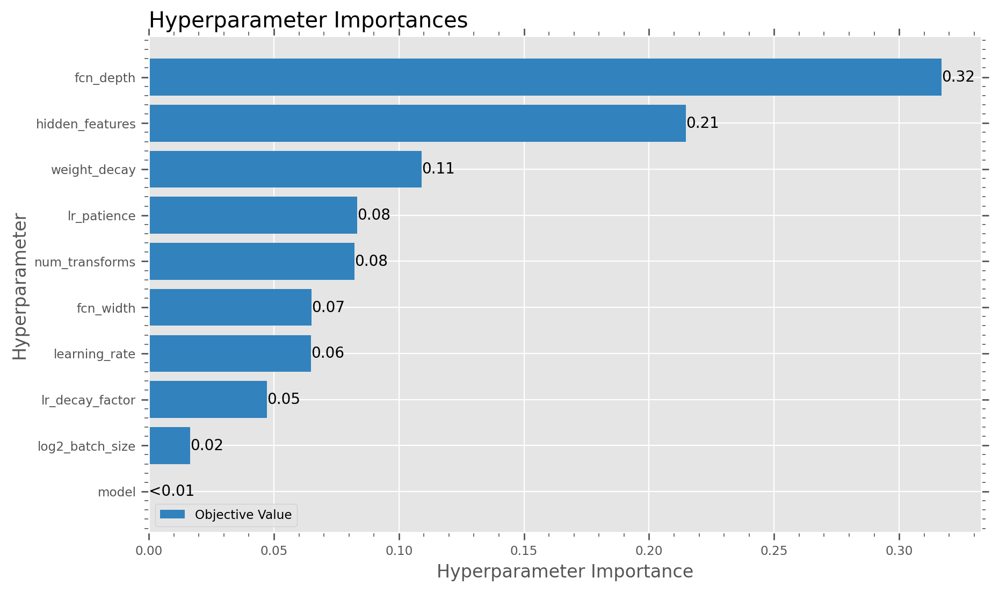

In [33]:
import optuna

filepath = join(modeldir, 'optuna_study.db')

# Load the 'summaries' study from the database
storage = f"sqlite:///{filepath}"
study = optuna.load_study(study_name=summaries, storage=storage)

# Print the study details
print(f"Study name: {study.study_name}")
print(f"Number of trials: {len(study.trials)}")

optuna.visualization.matplotlib.plot_optimization_history(study)
optuna.visualization.matplotlib.plot_param_importances(study)

In [34]:
parentdir = join(wdir, nbody, sim, 'models', tracer)

thetafid = np.array([0.3, 0.5, 0.7, 1.0, 0.8])

stdev = {}
studies = []
for s in os.listdir(parentdir):
    print(s)
    modeldir = join(parentdir, s, postfix)
    filepath = join(modeldir, 'posterior_samples.npy')
    if not exists(filepath):
        print('Missing samples. Skipping...')
        continue
    samples = np.load(filepath)
    theta = np.load(join(modeldir, 'theta_test.npy'))

    # Find indices where theta[:, :5] is close to thetafid
    mask = np.all(np.isclose(
        theta[:, [0, 4]], thetafid[[0, 4]], rtol=0.1), axis=1)
    mask &= (nbar > np.log10(1.4e-4))
    print(f'Found {np.sum(mask)} samples close to fiducial')

    # Keep only those samples
    samples = samples[:, mask]

    stdev[s] = np.std(samples, axis=0)


    filepath = join(modeldir, 'optuna_study.db')

    # Load the 'summaries' study from the database
    storage = f"sqlite:///{filepath}"
    study = optuna.load_study(study_name=s, storage=storage)
    studies.append(study)

nbar+zPk0+zPk2+zPk4+zBk0
Found 44 samples close to fiducial
nbar+zPk0+zPk2+zPk4
Found 44 samples close to fiducial
nbar+zPk0
Found 44 samples close to fiducial


/tmp/ipykernel_2865791/385523477.py:1: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  axs = optuna.visualization.matplotlib.plot_optimization_history(studies[::-1])


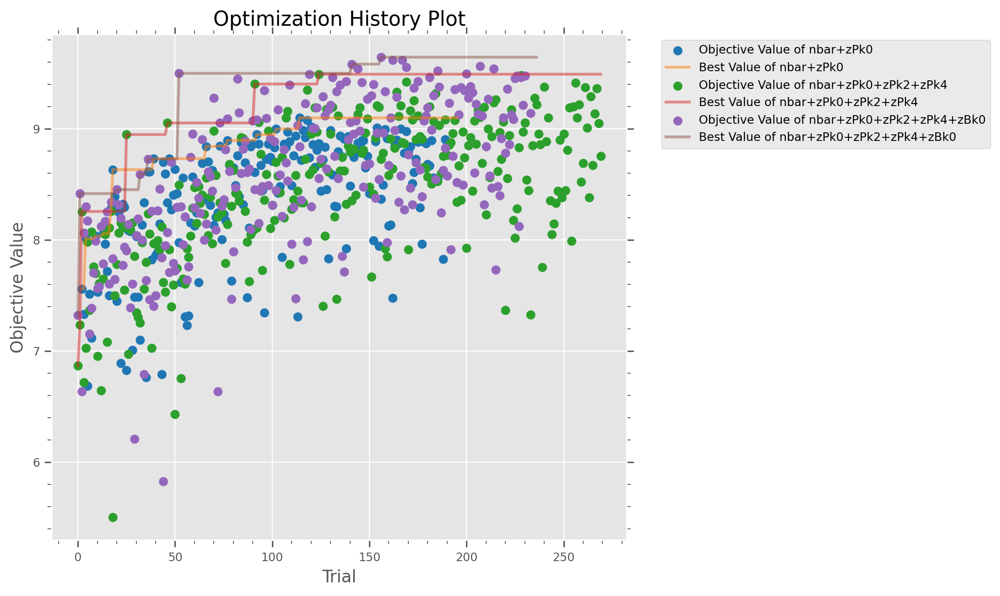

In [38]:
axs = optuna.visualization.matplotlib.plot_optimization_history(studies[::-1])

fig = axs.get_figure()
fig.savefig('temp.png')
# optuna.visualization.matplotlib.plot_param_importances(studies[::-1])

In [ ]:
parentdir = join(wdir, nbody, sim, 'models', tracer)

thetafid = np.array([0.3, 0.5, 0.7, 1.0, 0.8])

stdev = {}
studies = []
for s in os.listdir(parentdir):
    print(s)
    modeldir = join(parentdir, s, postfix)
    filepath = join(modeldir, 'posterior_samples.npy')
    if not exists(filepath):
        print('Missing samples. Skipping...')
        continue
    samples = np.load(filepath)
    theta = np.load(join(modeldir, 'theta_test.npy'))

In [6]:
def simple(label):
    if isinstance(label, list):
        return [simple(l) for l in label]
    label = label.replace('nbar', r'$\bar{n}$')
    label = label.replace('zPk0+zPk2+zPk4', r'$zP_{024}$')
    label = label.replace('zPk0', r'$zP_{0}$')
    label = label.replace('zBk0', r'$zB_{0}$')
    label = label.replace('zQk0', r'$zQ_{0}$')
    label = label.replace('+', ', ')

    return label

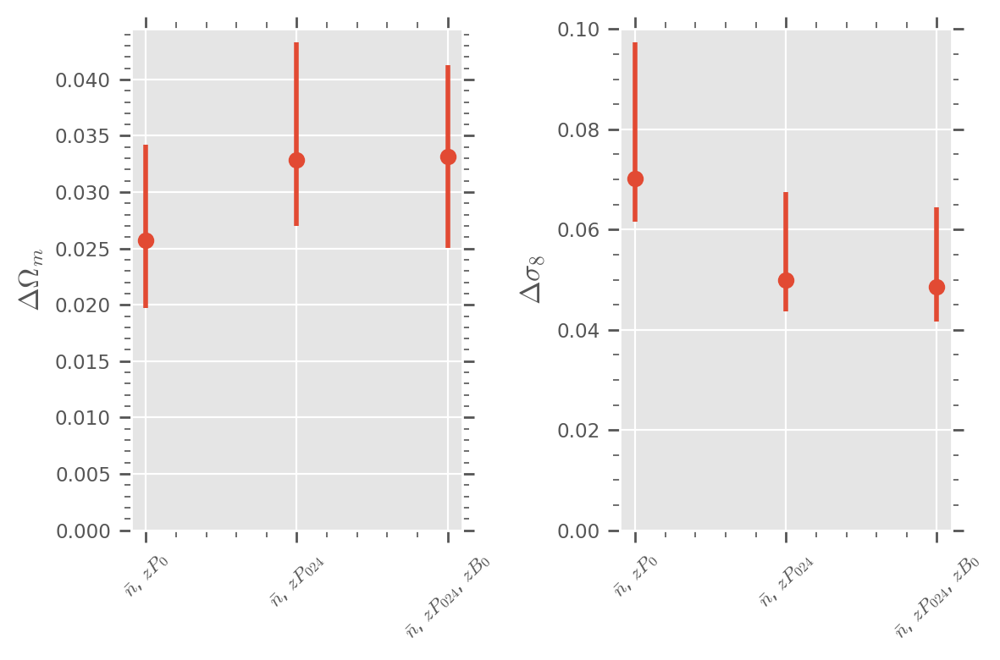

In [28]:
labels = sorted(list(stdev.keys()))

f, axs = plt.subplots(1,2, figsize=(6,4), sharex=True)
axs = axs.flatten()

names = [
    r'\Omega_m', r'\Omega_b', r'h', r'n_s', r'\sigma_8'
]

for j, i in enumerate([0, 4]):
    ax = axs[j]
    stdevs = [stdev[label][:, i] for label in labels]
    percentiles = np.percentile(stdevs, [50, 16, 84], axis=1)
    ax.errorbar(
        simple(labels), percentiles[0],
        yerr=[percentiles[0]-percentiles[1], percentiles[2]-percentiles[0]],
        fmt='o')
    ax.set_ylim(0)
    ax.set_ylabel(f'$\Delta {names[i]}$')
    ax.set_xticks(range(len(labels)))
    ax.set_xticklabels(simple(labels), rotation=45)

# axs[5].axis('off')
# axs[0].set_title('w/ BFast Bispectrum')
plt.tight_layout()

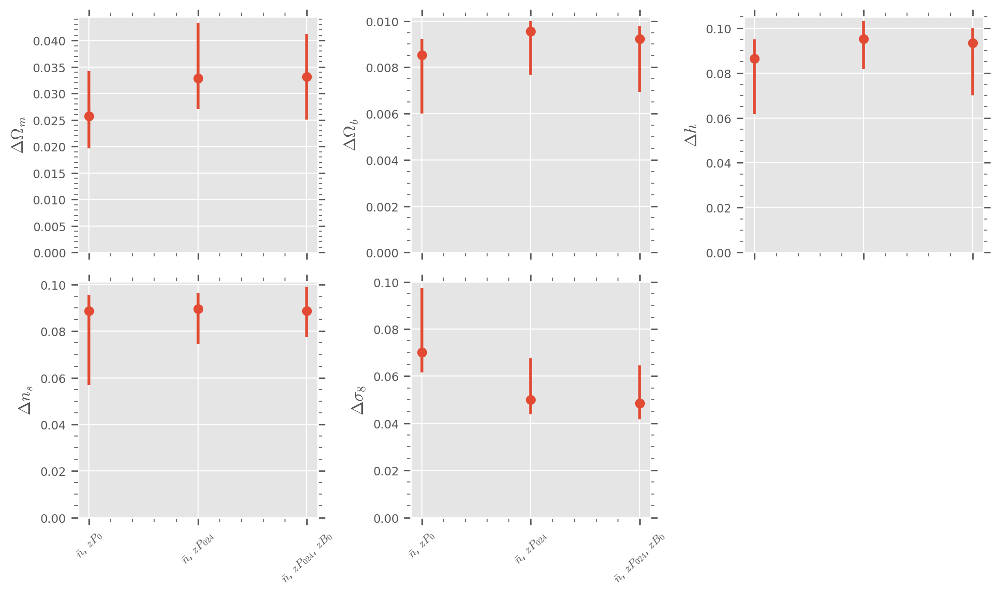

In [30]:
labels = sorted(list(stdev.keys()))

f, axs = plt.subplots(2, 3, figsize=(10, 6), sharex=True)
axs = axs.flatten()

names = [
    r'\Omega_m', r'\Omega_b', r'h', r'n_s', r'\sigma_8'
]

for i in range(5):
    ax = axs[i]
    stdevs = [stdev[label][:, i] for label in labels]
    percentiles = np.percentile(stdevs, [50, 16, 84], axis=1)
    ax.errorbar(
        simple(labels), percentiles[0],
        yerr=[percentiles[0]-percentiles[1], percentiles[2]-percentiles[0]],
        fmt='o')
    ax.set_ylim(0)
    ax.set_ylabel(f'$\Delta {names[i]}$')
    ax.set_xticks(range(len(labels)))
    ax.set_xticklabels(simple(labels), rotation=45)

axs[5].axis('off')
plt.tight_layout()

#### PolyBin

Study name: nbar+zPk0+zPk2+zPk4+zBk0
Number of trials: 210


/tmp/ipykernel_1015902/4058363880.py:24: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  optuna.visualization.matplotlib.plot_optimization_history(study)
/tmp/ipykernel_1015902/4058363880.py:25: ExperimentalWarning: optuna.visualization.matplotlib._param_importances.plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  optuna.visualization.matplotlib.plot_param_importances(study)
/tmp/ipykernel_1015902/4058363880.py:26: ExperimentalWarning: optuna.visualization.matplotlib._slice.plot_slice is experimental (supported from v2.2.0). The interface can change in the future.
  optuna.visualization.matplotlib.plot_slice(study)
/home/x-mho1/.conda/envs/2024.02-py311/cmassrun/lib/python3.10/site-packages/optuna/visualization/matplotlib/_slice.py:141: UserWarning: Attempting to set identical low and high xlims 

array([<Axes: xlabel='fcn_depth', ylabel='Objective Value'>,
       <Axes: xlabel='fcn_width'>, <Axes: xlabel='hidden_features'>,
       <Axes: xlabel='learning_rate'>, <Axes: xlabel='log2_batch_size'>,
       <Axes: xlabel='lr_decay_factor'>, <Axes: xlabel='lr_patience'>,
       <Axes: xlabel='model'>, <Axes: xlabel='num_transforms'>,
       <Axes: xlabel='weight_decay'>], dtype=object)

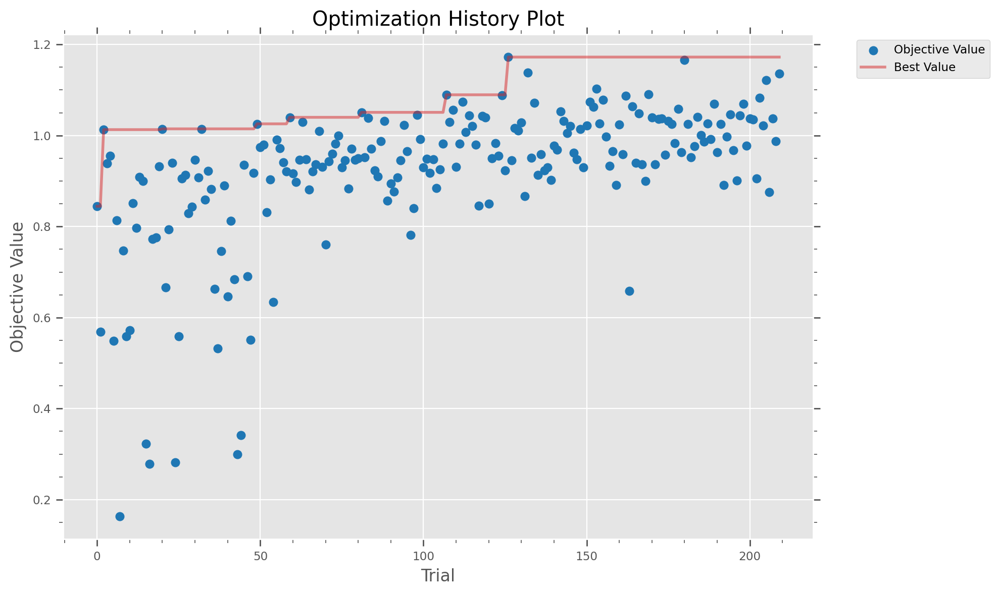

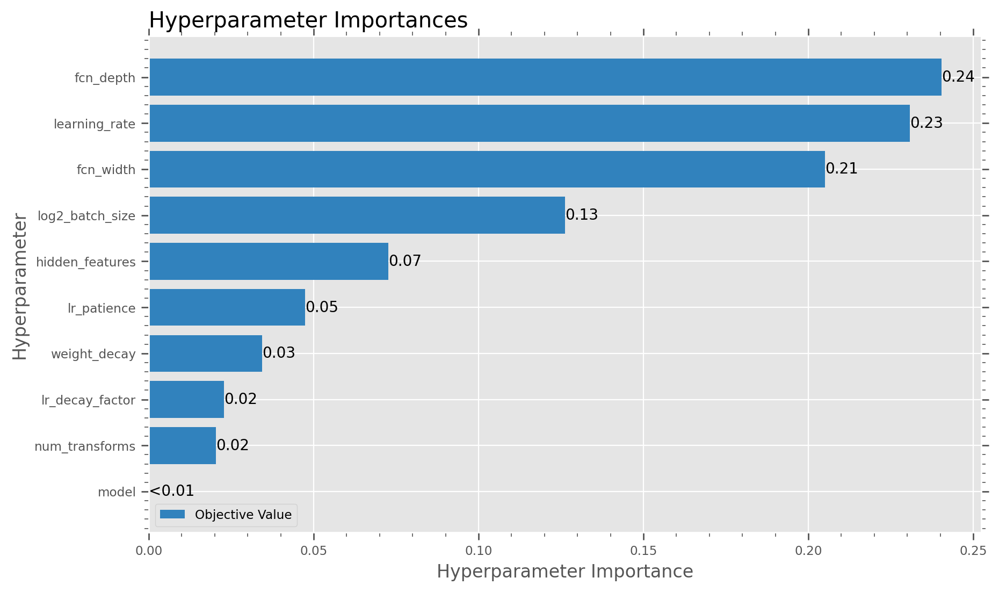

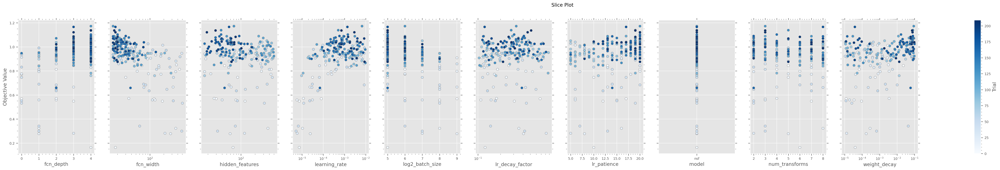

In [ ]:
# Baseline
import optuna
nbody = 'quijotelike'
sim = 'fastpm_polybin_Omonly'
tracer = 'galaxy'
postfix = 'kmin-0.0_kmax-0.4'
summlist = ['nbar', 'zPk0', 'zPk2', 'zPk4', 'zBk0']  # , 'zBk2']

summaries = '+'.join(summlist)
modeldir = join(wdir, nbody, sim, 'models', tracer, summaries, postfix)

nbar = np.load(join(modeldir, 'x_test.npy'))[:, -1]

filepath = join(modeldir, 'optuna_study.db')

# Load the 'summaries' study from the database
storage = f"sqlite:///{filepath}"
study = optuna.load_study(study_name=summaries, storage=storage)

# Print the study details
print(f"Study name: {study.study_name}")
print(f"Number of trials: {len(study.trials)}")

optuna.visualization.matplotlib.plot_optimization_history(study)
optuna.visualization.matplotlib.plot_param_importances(study)
optuna.visualization.matplotlib.plot_slice(study)

/anvil/scratch/x-mho1/cmass-ili/quijotelike/fastpm_polybin_Omonly/models/galaxy/nbar+zPk0+zPk2+zPk4+zBk0/kmin-0.0_kmax-0.4
[{'training_log_probs': [0.7721041259765625, 1.246093017578125, 1.35568505859375, 1.3872313232421876, 1.400655029296875, 1.441917724609375, 1.4702177734375, 1.467058837890625, 1.4811712646484374, 1.50288037109375, 1.5185970458984375, 1.51517529296875, 1.542887451171875, 1.5393218994140625, 1.559013427734375, 1.55049658203125, 1.56116357421875, 1.570166015625, 1.60365673828125, 1.585559326171875, 1.60536865234375, 1.5892255859375, 1.5918095703125, 1.5954774169921875, 1.61637939453125, 1.61517919921875, 1.6314495849609374, 1.745902099609375, 1.774252685546875, 1.784551025390625, 1.7893426513671875, 1.7925867919921874, 1.7974329833984375, 1.7976663818359375, 1.8021239013671875, 1.8055672607421875, 1.8093048095703126, 1.80841650390625, 1.807899169921875, 1.8125584716796874, 1.813297607421875, 1.817415771484375, 1.822859130859375, 1.8439306640625, 1.8462554931640625, 1.

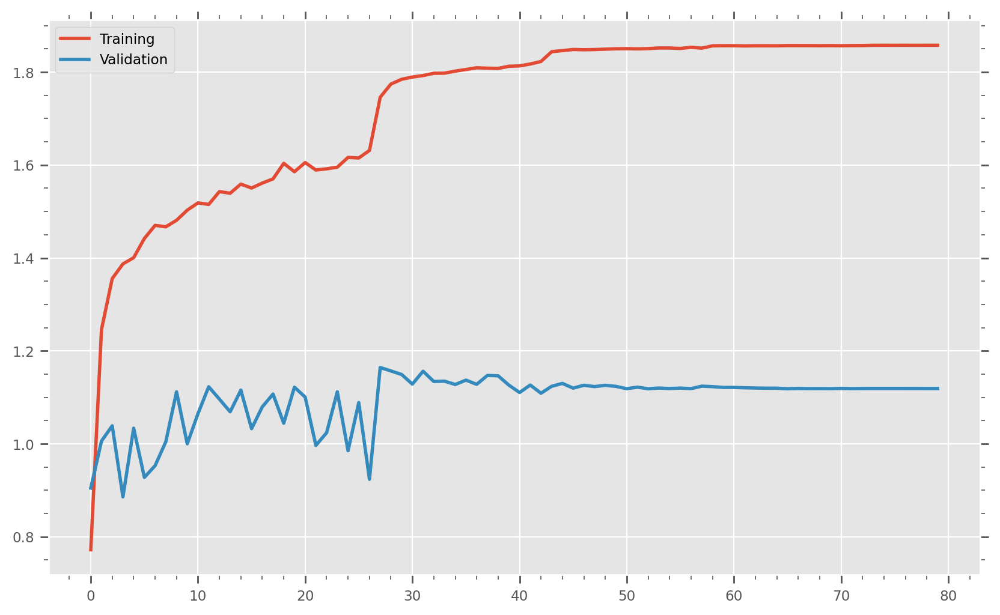

In [ ]:
import json
ndirs = os.listdir(join(modeldir, 'nets'))
idx = 0
n = ndirs[idx]

filepath = join(modeldir, 'nets', n, 'summary.json')
with open(filepath, 'r') as f:
    summary = json.load(f)
print(modeldir)
print(summary)

f, ax = plt.subplots()
ax.plot(summary[0]['training_log_probs'], label='Training')
ax.plot(summary[0]['validation_log_probs'], label='Validation')
ax.legend()

In [19]:
parentdir = join(wdir, nbody, sim, 'models', tracer)

thetafid = np.array([0.3, 0.5, 0.7, 1.0, 0.8])

stdev = {}
temp = []
for s in os.listdir(parentdir):
    print(s)
    modeldir = join(parentdir, s, postfix)
    filepath = join(modeldir, 'posterior_samples.npy')
    if not exists(filepath):
        print('Missing samples. Skipping...')
        continue
    samples = np.load(filepath)
    theta = np.load(join(modeldir, 'theta_test.npy'))

    # Find indices where theta[:, :5] is close to thetafid
    mask = np.all(np.isclose(
        theta[:, [0, 4]], thetafid[[0, 4]], rtol=0.1), axis=1)
    mask &= (nbar > np.log10(1.4e-4))
    print(f'Found {np.sum(mask)} samples close to fiducial')

    # Keep only those samples
    samples = samples[:, mask]

    stdev[s] = np.std(samples, axis=0)
    temp.append(samples)

nbar+zBk0
Found 32 samples close to fiducial
nbar+zPk0+zPk2+zPk4+zBk0
Found 32 samples close to fiducial
nbar+zPk0+zPk2+zPk4+zQk0
Found 32 samples close to fiducial
nbar+zBk0+zBk2
Found 32 samples close to fiducial
nbar+zPk0+zPk2+zPk4
Found 32 samples close to fiducial
nbar+zPk0+zPk2+zPk4+zBk0+zBk2
Found 32 samples close to fiducial
nbar+zPk0
Found 32 samples close to fiducial


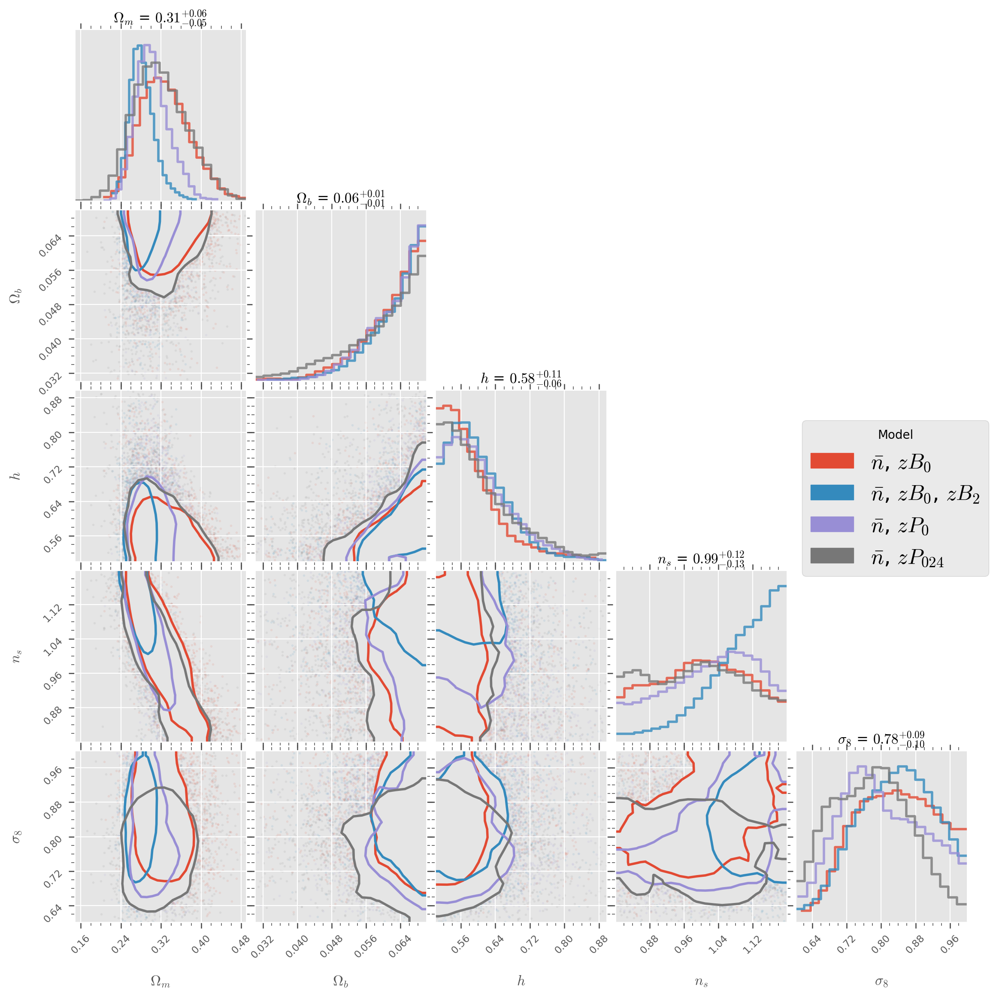

In [20]:
import matplotlib.patches as mpatches
import corner

names = [
    r'\Omega_m', r'\Omega_b', r'h', r'n_s', r'\sigma_8',
    r'\sigma_{\rm radial}', r'\sigma_{\rm transverse}'
]
names = [f'${n}$' for n in names]

ind = 4

modelnames = os.listdir(parentdir)

fig = None
for i, arr in enumerate(temp[:4]):
    s = arr[:, ind]
    fig = corner.corner(
        s, labels=names, smooth=True, fig=fig,
        color=f'C{i}',  # Use matplotlib color cycle
        label_kwargs={'fontsize': 12},
        show_titles=True,
        title_kwargs={"fontsize": 12},
        plot_density=False,
        plot_contours=True,
        levels=[0.68],  # , 0.95]
        hist_kwargs={'linewidth': 2, 'alpha': 0.8},
        smooth1d=1.0  # increase smoothing for 1D histograms
    )

# Add legend with model names
modelnames = sorted(list(stdev.keys()))
handles = [mpatches.Patch(color=f'C{i}', label=simple(
    modelnames[i])) for i in range(len(modelnames[:4]))]
fig.legend(handles=handles, loc='center right', fontsize=18, title='Model')

In [21]:
def simple(label):
    if isinstance(label, list):
        return [simple(l) for l in label]
    label = label.replace('nbar', r'$\bar{n}$')
    label = label.replace('zPk0+zPk2+zPk4', r'$zP_{024}$')
    label = label.replace('zPk0', r'$zP_{0}$')
    label = label.replace('zBk0', r'$zB_{0}$')
    label = label.replace('zQk0', r'$zQ_{0}$')
    label = label.replace('zBk2', r'$zB_{2}$')
    label = label.replace('zQk2', r'$zQ_{2}$')
    label = label.replace('+', ', ')

    return label

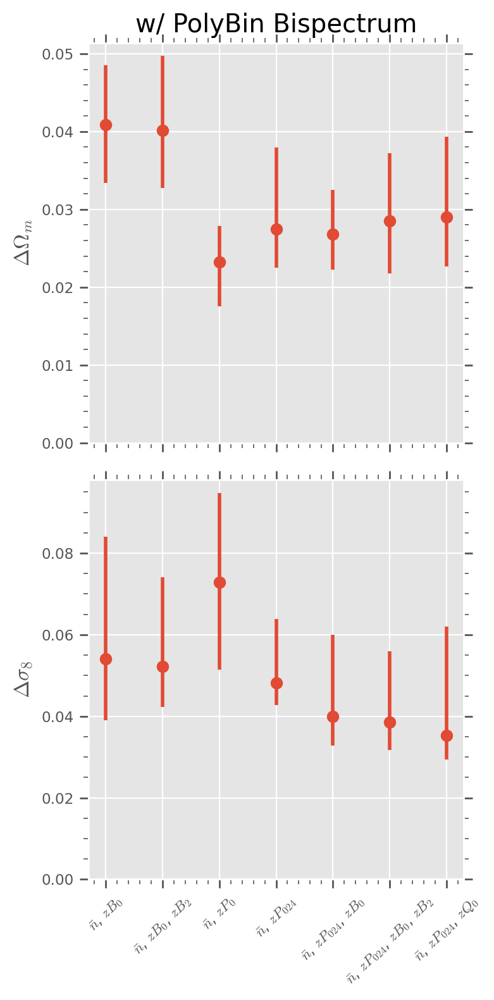

In [22]:
labels = sorted(list(stdev.keys()))

f, axs = plt.subplots(2, 1, figsize=(4, 8), sharex=True)
axs = axs.flatten()

names = [
    r'\Omega_m', r'\Omega_b', r'h', r'n_s', r'\sigma_8'
]

for j, i in enumerate([0, 4]):
    ax = axs[j]
    stdevs = [stdev[label][:, i] for label in labels]
    percentiles = np.percentile(stdevs, [50, 16, 84], axis=1)
    ax.errorbar(
        simple(labels), percentiles[0],
        yerr=[percentiles[0]-percentiles[1], percentiles[2]-percentiles[0]],
        fmt='o')
    ax.set_ylim(0)
    ax.set_ylabel(f'$\Delta {names[i]}$')
    ax.set_xticks(range(len(labels)))
    ax.set_xticklabels(simple(labels), rotation=45)

# axs[5].axis('off')
axs[0].set_title('w/ PolyBin Bispectrum')
plt.tight_layout()

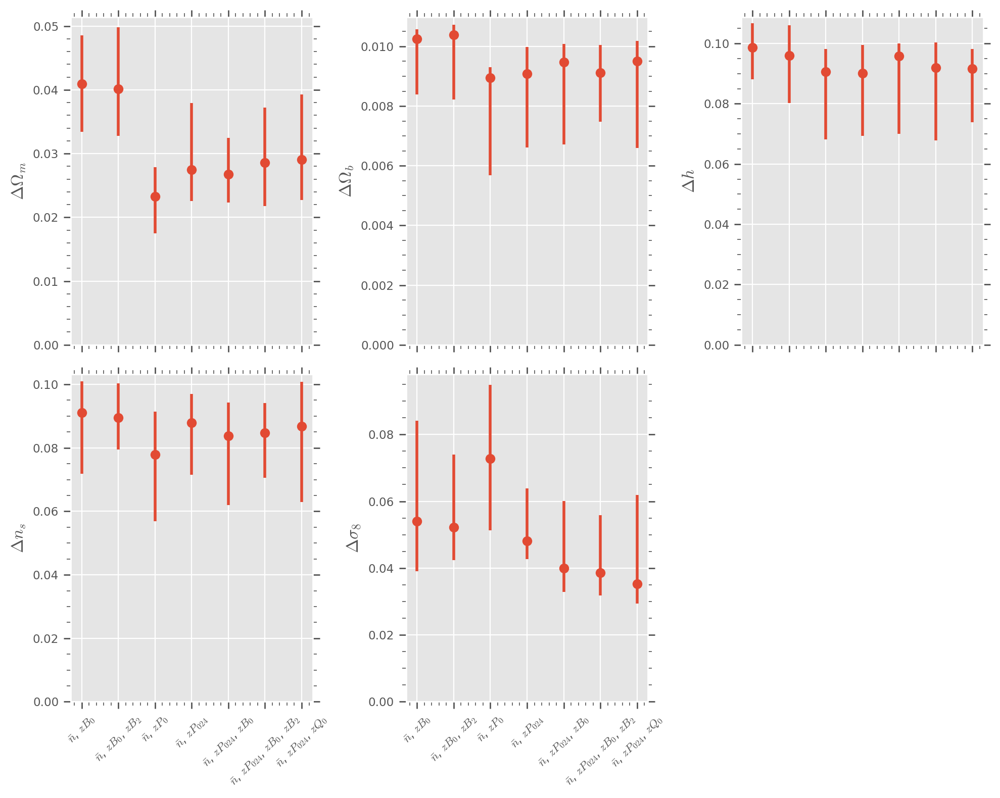

In [23]:
labels = sorted(list(stdev.keys()))

f, axs = plt.subplots(2, 3, figsize=(10, 8), sharex=True)
axs = axs.flatten()

names = [
    r'\Omega_m', r'\Omega_b', r'h', r'n_s', r'\sigma_8'
]

for i in range(5):
    ax = axs[i]
    stdevs = [stdev[label][:, i] for label in labels]
    percentiles = np.percentile(stdevs, [50, 16, 84], axis=1)
    ax.errorbar(
        simple(labels), percentiles[0],
        yerr=[percentiles[0]-percentiles[1], percentiles[2]-percentiles[0]],
        fmt='o')
    ax.set_ylim(0)
    ax.set_ylabel(f'$\Delta {names[i]}$')
    ax.set_xticks(range(len(labels)))
    ax.set_xticklabels(simple(labels), rotation=45)

axs[5].axis('off')
plt.tight_layout()

## Check comparison in data space

In [19]:
paramfile = '/home/x-mho1/git/ltu-cmass-run/params/latin_hypercube_params.txt'
params = np.loadtxt(paramfile)

In [23]:
params = params[:2000]
params[1534]

array([0.4933 , 0.05641, 0.8869 , 0.8045 , 0.9841 ])

In [16]:
mean, std = np.mean(params, axis=0), np.std(params, axis=0)
params = (params - mean) / std
paramnorm = np.linalg.norm(params, axis=1)

In [ ]:
np.argsort(paramnorm)[:15]

array([ 663,   66,  354, ..., 1534,  265,  637])

### Load CHARM

In [25]:
nbody = 'quijotelike'
sim = 'fastpm_nonoise'
L, N = 1000, 128
tracer = 'galaxy'

lhidlist = [663] + list(range(4)) + [637] + [1534]

suitedir = join(wdir, nbody, sim, f'L{L}-N{N}')

lhid = str(lhidlist[0])
os.listdir(join(suitedir, lhid, 'galaxies'))

['hod00000.h5']

In [26]:
from cmass.infer.loaders import get_cosmo
from copy import deepcopy
from cmass.diagnostics.summ import (
    MAz, noise_positions, run_pylians, run_bispectrum, get_mesh_resolution
)
from cmass.infer.loaders import _is_equilateral


def summarize_tracer(
    pos, vel,
    noise_uniform=False,
    noise_radial=0.,
    noise_transverse=0.,
    L=1000, N=128
):
    pos = deepcopy(pos)
    vel = deepcopy(vel)
    if noise_uniform:
        dL = L/N
        pos += np.random.uniform(-dL/2, dL/2, size=pos.shape)

    if noise_radial > 0. or noise_transverse > 0.:
        pos = noise_positions(pos, ra=0, dec=90,
                              noise_radial=noise_radial,
                              noise_transverse=noise_transverse)

    N, MAS = get_mesh_resolution(L, high_res=True, use_ngp=False)
    field = MAz(pos, vel, L, N, cosmo, 0.5, MAS, axis=2).astype(np.float32)
    pspec = run_pylians(field, L, axis=2, MAS=MAS, num_threads=32, use_rsd=True)

    N, MAS = get_mesh_resolution(L, high_res=False, use_ngp=False)
    field = MAz(pos, vel, L, N, cosmo, 0.5, MAS, axis=2).astype(np.float32)
    bspec = run_bispectrum(
        field, L, axis=2, MAS=MAS,
        num_threads=128, use_rsd=True,
        cache_dir=None,
        backend='polybin'
    )

    out = {**pspec, **bspec}

    k123 = out['zBk_k123']
    m = _is_equilateral(k123)
    out[f'zEqQk'] = out[f'zQk'][:, m]
    out[f'zEqBk'] = out[f'zBk'][:, m]
    out['zEqBk_k123'] = out['zBk_k123'][:, m]

    return out


def load_galaxies(filename, a='0.666667'):
    with h5py.File(filename, 'r') as f:
        pos = f[a]['pos'][...].astype(np.float32)
        vel = f[a]['vel'][...].astype(np.float32)
    return pos, vel


def load_hod(filename, a='0.666667'):
    with h5py.File(filename, 'r') as f:
        hod = dict(f.attrs)
    return hod


record = {}
cosmos = []
hods = []
for lhid in lhidlist:
    print(f'Processing lh {lhid}...')
    simdir = join(suitedir, str(lhid))
    galfile = join(simdir, 'galaxies', 'hod00000.h5')
    pos, vel = load_galaxies(galfile)

    # reciprocal noise
    a = np.log(0.1)
    b = np.log(4.5105)
    radial, transverse = np.exp(np.random.uniform(a, b, size=2))

    out = summarize_tracer(
        pos, vel,
        noise_uniform=True,
        noise_radial=radial,
        noise_transverse=transverse
    )
    out['nbar'] = len(pos)/L**3
    record[lhid] = out
    k = load_hod(galfile)
    c = get_cosmo(simdir)
    hods.append(k)
    cosmos.append(c)

cosmos = np.array(cosmos)
hods = np.array(hods)

/home/x-mho1/.conda/envs/2024.02-py311/cmassrun/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Processing lh 663...


[08:22:42-INFO] Running calcBk_polybin...



# Dimensions: [1.00e+03, 1.00e+03, 1.00e+03] Mpc/h
# Center: [0.00e+00, 0.00e+00, 0.00e+00] Mpc/h
# Line-of-sight: global
# Cartesian grid: [128, 128, 128]
# Fundamental frequency: [0.0063, 0.0063, 0.0063] h/Mpc
# Nyquist frequency: [0.402, 0.402, 0.402] h/Mpc
# Pixel window: tsc
# Using FFTW backend

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
Mask: constant

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
N_bins: 406
Mask: constant
Computing ideal Fisher matrix
Computing degeneracy factor
Computing ideal Fisher matrix


[08:22:57-INFO] Finished calcBk_polybin... (0m15s)


Processing lh 0...


[08:22:58-INFO] Running calcBk_polybin...



# Dimensions: [1.00e+03, 1.00e+03, 1.00e+03] Mpc/h
# Center: [0.00e+00, 0.00e+00, 0.00e+00] Mpc/h
# Line-of-sight: global
# Cartesian grid: [128, 128, 128]
# Fundamental frequency: [0.0063, 0.0063, 0.0063] h/Mpc
# Nyquist frequency: [0.402, 0.402, 0.402] h/Mpc
# Pixel window: tsc
# Using FFTW backend

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
Mask: constant

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
N_bins: 406
Mask: constant
Computing ideal Fisher matrix
Computing degeneracy factor
Computing ideal Fisher matrix


[08:23:15-INFO] Finished calcBk_polybin... (0m16s)


Processing lh 1...


[08:23:16-INFO] Running calcBk_polybin...



# Dimensions: [1.00e+03, 1.00e+03, 1.00e+03] Mpc/h
# Center: [0.00e+00, 0.00e+00, 0.00e+00] Mpc/h
# Line-of-sight: global
# Cartesian grid: [128, 128, 128]
# Fundamental frequency: [0.0063, 0.0063, 0.0063] h/Mpc
# Nyquist frequency: [0.402, 0.402, 0.402] h/Mpc
# Pixel window: tsc
# Using FFTW backend

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
Mask: constant

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
N_bins: 406
Mask: constant
Computing ideal Fisher matrix
Computing degeneracy factor
Computing ideal Fisher matrix


[08:23:34-INFO] Finished calcBk_polybin... (0m17s)


Processing lh 2...


[08:23:35-INFO] Running calcBk_polybin...



# Dimensions: [1.00e+03, 1.00e+03, 1.00e+03] Mpc/h
# Center: [0.00e+00, 0.00e+00, 0.00e+00] Mpc/h
# Line-of-sight: global
# Cartesian grid: [128, 128, 128]
# Fundamental frequency: [0.0063, 0.0063, 0.0063] h/Mpc
# Nyquist frequency: [0.402, 0.402, 0.402] h/Mpc
# Pixel window: tsc
# Using FFTW backend

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
Mask: constant

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
N_bins: 406
Mask: constant
Computing ideal Fisher matrix
Computing degeneracy factor
Computing ideal Fisher matrix


[08:23:58-INFO] Finished calcBk_polybin... (0m22s)


Processing lh 3...


[08:23:59-INFO] Running calcBk_polybin...



# Dimensions: [1.00e+03, 1.00e+03, 1.00e+03] Mpc/h
# Center: [0.00e+00, 0.00e+00, 0.00e+00] Mpc/h
# Line-of-sight: global
# Cartesian grid: [128, 128, 128]
# Fundamental frequency: [0.0063, 0.0063, 0.0063] h/Mpc
# Nyquist frequency: [0.402, 0.402, 0.402] h/Mpc
# Pixel window: tsc
# Using FFTW backend

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
Mask: constant

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
N_bins: 406
Mask: constant
Computing ideal Fisher matrix
Computing degeneracy factor
Computing ideal Fisher matrix


[08:24:20-INFO] Finished calcBk_polybin... (0m20s)


Processing lh 637...


FileNotFoundError: [Errno 2] Unable to synchronously open file (unable to open file: name = '/anvil/scratch/x-mho1/cmass-ili/quijotelike/fastpm_nonoise/L1000-N128/637/galaxies/hod00000.h5', errno = 2, error message = 'No such file or directory', flags = 0, o_flags = 0)

In [ ]:
# Setup colormap

from matplotlib import cm, colors
Om = cosmos[:, 0]
s8 = cosmos[:, 4]

par = Om
parname = '$\Omega_m$'
# par = s8
# parname = '$\sigma_8$'

cmap = cm.get_cmap('viridis')
norm = colors.Normalize(vmin=par.min(), vmax=par.max())
cs = cmap(norm(par))

/tmp/ipykernel_1174771/487458172.py:12: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('viridis')


Text(0.5, 0.95, 'CHARM summaries as a function of $\\Omega_m$, \n $\\Omega_m$-new / fiducial (lhid=663)')

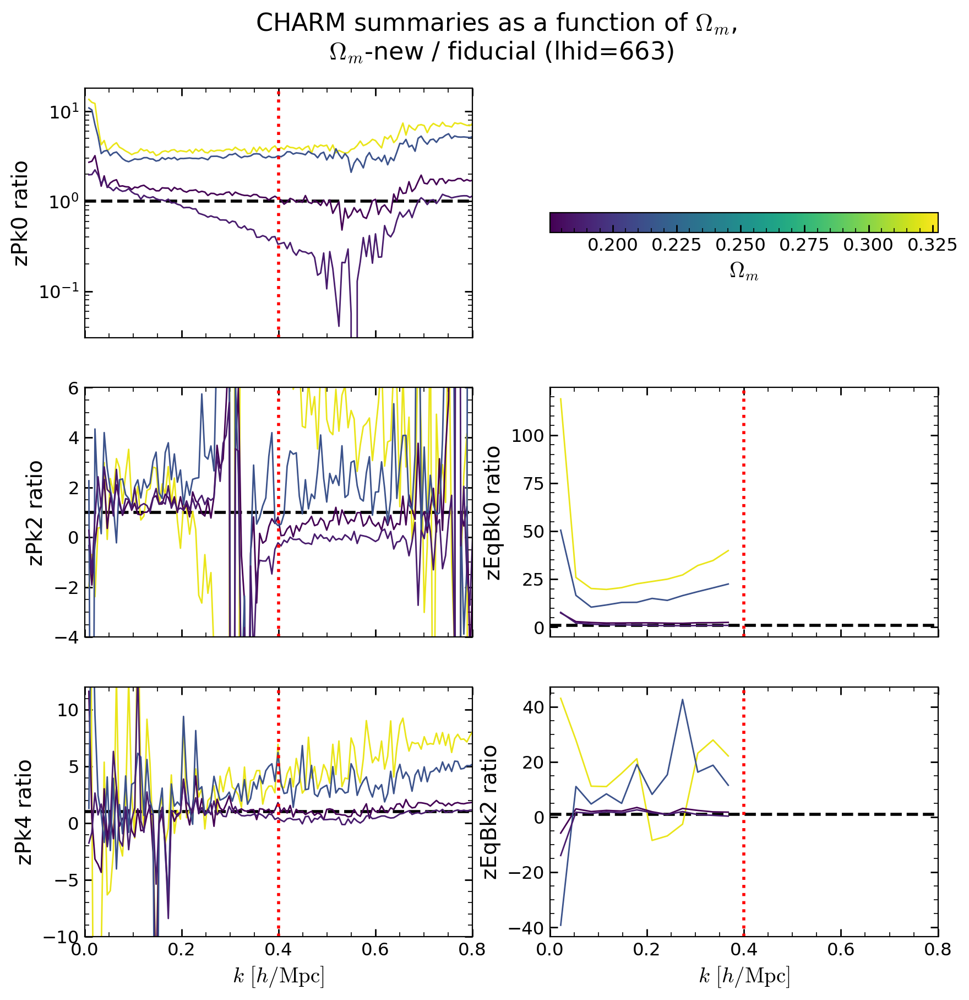

In [ ]:
f, axs = plt.subplots(3, 2, figsize=(10, 10), sharex=True)
# axs = axs.flatten()

fid = record[663]

kmin, kmax = 0.0, 0.4

ax = axs[0, 0]
ax.semilogy()
ax.axhline(1, color='k', ls='--')
for lhid in lhidlist[1:]:
    data = record[lhid]
    x = (data['zPk'][:, 0] - 1/data['nbar'])/(fid['zPk'][:, 0] - 1/fid['nbar'])
    ax.plot(data['zPk_k3D'], x, label=f'lhid={lhid}', lw=1, c=cs[lhid])
ax.set_ylabel('zPk0 ratio')
ax.axvline(kmax, color='r', ls=':')

ax = axs[1, 0]
ax.axhline(1, color='k', ls='--')
ax.set_ylim(-4, 6)
for lhid in lhidlist[1:]:
    data = record[lhid]
    x = (data['zPk'][:, 1])/(fid['zPk'][:, 1])
    ax.plot(data['zPk_k3D'], x, label=f'lhid={lhid}', lw=1, c=cs[lhid])
ax.set_ylabel('zPk2 ratio')
ax.axvline(kmax, color='r', ls=':')


ax = axs[2, 0]
ax.axhline(1, color='k', ls='--')
ax.set_ylim(-10, 12)
for lhid in lhidlist[1:]:
    data = record[lhid]
    x = (data['zPk'][:, 2])/(fid['zPk'][:, 2])
    ax.plot(data['zPk_k3D'], x, label=f'lhid={lhid}', lw=1, c=cs[lhid])
ax.set_ylabel('zPk4 ratio')
ax.set_xlabel(r'$k\ [h/\mathrm{Mpc}]$')
ax.axvline(kmax, color='r', ls=':')


ax = axs[1, 1]
ax.axhline(1, color='k', ls='--')
for lhid in lhidlist[1:]:
    data = record[lhid]
    x = (data['zEqBk'][0])/(fid['zEqBk'][0])
    ax.plot(data['zEqBk_k123'][0], x, label=f'lhid={lhid}', lw=1, c=cs[lhid])
ax.set_ylabel('zEqBk0 ratio')
ax.axvline(kmax, color='r', ls=':')

ax = axs[2, 1]
ax.axhline(1, color='k', ls='--')
for lhid in lhidlist[1:]:
    data = record[lhid]
    x = (data['zEqBk'][1])/(fid['zEqBk'][1])
    ax.plot(data['zEqBk_k123'][0], x, label=f'lhid={lhid}', lw=1, c=cs[lhid])
ax.set_ylabel('zEqBk2 ratio')
ax.set_xlabel(r'$k\ [h/\mathrm{Mpc}]$')
ax.axvline(kmax, color='r', ls=':')

ax.set_xlim(0, 0.8)

ax = axs[0, 1]
ax.axis('off')
plt.colorbar(
    cm.ScalarMappable(norm=norm, cmap=cmap), ax=ax, label=parname,
    orientation='horizontal', location='bottom', fraction=0.5)

plt.suptitle(f'CHARM summaries as a function of {parname}, '
             f"\n {parname}-new / fiducial (lhid=663)",
             fontsize=16, y=0.95)

### Plot at a fixed noise level

In [ ]:
nbody = 'quijote'
sim = 'nbody'
# L, N = 1000, 128
# tracer = 'galaxy'
lhidlist = lhidlist  # [663] + list(range(10))
suitedir = join(wdir, nbody, sim, f'L{L}-N{N}')

sigrad = 1.7
sigtran = 3.3

qrecord = {}
qcosmos = []
qhods = []
for lhid in lhidlist:
    print(f'Processing lh {lhid}...')
    simdir = join(suitedir, str(lhid))
    galfile = join(simdir, 'galaxies', 'hod00000.h5')
    pos, vel = load_galaxies(galfile)
    # pos = noise_uniform(pos, L, N)
    out = summarize_tracer(
        pos, vel,
        noise_uniform=False,
        noise_radial=sigrad,
        noise_transverse=sigtran,
    )
    out['nbar'] = len(pos)/L**3
    qrecord[lhid] = out

    k = load_hod(galfile)
    c = get_cosmo(simdir)
    qhods.append(k)
    qcosmos.append(c)

qcosmos = np.array(qcosmos)
qhods = np.array(qhods)

Processing lh 663...


[00:05:13-INFO] Running calcBk_polybin...



# Dimensions: [1.00e+03, 1.00e+03, 1.00e+03] Mpc/h
# Center: [0.00e+00, 0.00e+00, 0.00e+00] Mpc/h
# Line-of-sight: global
# Cartesian grid: [128, 128, 128]
# Fundamental frequency: [0.0063, 0.0063, 0.0063] h/Mpc
# Nyquist frequency: [0.402, 0.402, 0.402] h/Mpc
# Pixel window: tsc
# Using FFTW backend

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
Mask: constant

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
N_bins: 406
Mask: constant
Computing ideal Fisher matrix
Computing degeneracy factor
Computing ideal Fisher matrix


[00:05:32-INFO] Finished calcBk_polybin... (0m18s)


Processing lh 0...


[00:05:33-INFO] Running calcBk_polybin...



# Dimensions: [1.00e+03, 1.00e+03, 1.00e+03] Mpc/h
# Center: [0.00e+00, 0.00e+00, 0.00e+00] Mpc/h
# Line-of-sight: global
# Cartesian grid: [128, 128, 128]
# Fundamental frequency: [0.0063, 0.0063, 0.0063] h/Mpc
# Nyquist frequency: [0.402, 0.402, 0.402] h/Mpc
# Pixel window: tsc
# Using FFTW backend

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
Mask: constant

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
N_bins: 406
Mask: constant
Computing ideal Fisher matrix
Computing degeneracy factor
Computing ideal Fisher matrix


[00:05:49-INFO] Finished calcBk_polybin... (0m15s)


Processing lh 1...


[00:05:50-INFO] Running calcBk_polybin...



# Dimensions: [1.00e+03, 1.00e+03, 1.00e+03] Mpc/h
# Center: [0.00e+00, 0.00e+00, 0.00e+00] Mpc/h
# Line-of-sight: global
# Cartesian grid: [128, 128, 128]
# Fundamental frequency: [0.0063, 0.0063, 0.0063] h/Mpc
# Nyquist frequency: [0.402, 0.402, 0.402] h/Mpc
# Pixel window: tsc
# Using FFTW backend

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
Mask: constant

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
N_bins: 406
Mask: constant
Computing ideal Fisher matrix
Computing degeneracy factor
Computing ideal Fisher matrix


[00:06:23-INFO] Finished calcBk_polybin... (0m33s)


Processing lh 2...


[00:06:25-INFO] Running calcBk_polybin...



# Dimensions: [1.00e+03, 1.00e+03, 1.00e+03] Mpc/h
# Center: [0.00e+00, 0.00e+00, 0.00e+00] Mpc/h
# Line-of-sight: global
# Cartesian grid: [128, 128, 128]
# Fundamental frequency: [0.0063, 0.0063, 0.0063] h/Mpc
# Nyquist frequency: [0.402, 0.402, 0.402] h/Mpc
# Pixel window: tsc
# Using FFTW backend

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
Mask: constant

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
N_bins: 406
Mask: constant
Computing ideal Fisher matrix
Computing degeneracy factor
Computing ideal Fisher matrix


[00:06:53-INFO] Finished calcBk_polybin... (0m28s)


Processing lh 3...


[00:06:54-INFO] Running calcBk_polybin...



# Dimensions: [1.00e+03, 1.00e+03, 1.00e+03] Mpc/h
# Center: [0.00e+00, 0.00e+00, 0.00e+00] Mpc/h
# Line-of-sight: global
# Cartesian grid: [128, 128, 128]
# Fundamental frequency: [0.0063, 0.0063, 0.0063] h/Mpc
# Nyquist frequency: [0.402, 0.402, 0.402] h/Mpc
# Pixel window: tsc
# Using FFTW backend

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
Mask: constant

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
N_bins: 406
Mask: constant
Computing ideal Fisher matrix
Computing degeneracy factor
Computing ideal Fisher matrix


[00:07:25-INFO] Finished calcBk_polybin... (0m31s)


Text(0.5, 0.92, 'Summaries as a function of noise, averaged over cosmo\n Quijote $[\\sigma_{r}=1.7, \\sigma_{t}=3.3]$ / CHARM rec-noise')

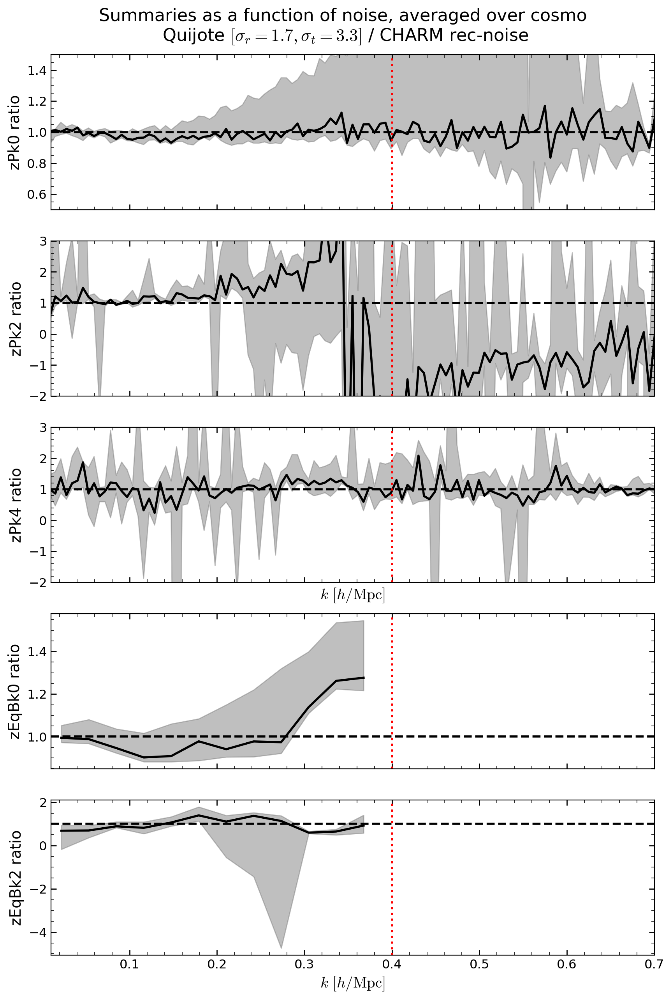

In [ ]:
f, axs = plt.subplots(5, 1, figsize=(10, 15), sharex=True)
# axs = axs.flatten()


kmin, kmax = 0.0, 0.4

ax = axs[0]
ax.axhline(1, color='k', ls='--')
xs = []
for lhid in lhidlist:
    data = record[lhid]
    qdata = qrecord[lhid]
    x = (qdata['zPk'][:, 0] - 1/qdata['nbar']) / \
        (data['zPk'][:, 0] - 1/data['nbar'])
    xs.append(x)
percs = np.percentile(xs, [16, 50, 84], axis=0)
ax.fill_between(data['zPk_k3D'], percs[0], percs[2],
                color='gray', alpha=0.5, label='16-84th perc.')
ax.plot(data['zPk_k3D'], percs[1], color='black', lw=2, label='Median')
ax.set_ylabel('zPk0 ratio')
ax.axvline(kmax, color='r', ls=':')
ax.set_ylim(0.5, 1.5)

ax = axs[1]
ax.axhline(1, color='k', ls='--')
ax.set_ylim(-2, 3)
xs = []
for lhid in lhidlist[1:]:
    data = record[lhid]
    qdata = qrecord[lhid]
    x = (qdata['zPk'][:, 1])/(data['zPk'][:, 1])
    xs.append(x)
percs = np.percentile(xs, [16, 50, 84], axis=0)
ax.fill_between(data['zPk_k3D'], percs[0], percs[2],
                color='gray', alpha=0.5, label='16-84th perc.')
ax.plot(data['zPk_k3D'], percs[1], color='black', lw=2, label='Median')
ax.set_ylabel('zPk2 ratio')
ax.axvline(kmax, color='r', ls=':')


ax = axs[2]
ax.axhline(1, color='k', ls='--')
ax.set_ylim(-2, 3)
xs = []
for lhid in lhidlist:
    data = record[lhid]
    qdata = qrecord[lhid]
    x = (qdata['zPk'][:, 2])/(data['zPk'][:, 2])
    xs.append(x)
percs = np.percentile(xs, [16, 50, 84], axis=0)
ax.fill_between(data['zPk_k3D'], percs[0], percs[2],
                color='gray', alpha=0.5, label='16-84th perc.')
ax.plot(data['zPk_k3D'], percs[1], color='black', lw=2, label='Median')
ax.set_ylabel('zPk4 ratio')
ax.set_xlabel(r'$k\ [h/\mathrm{Mpc}]$')
ax.axvline(kmax, color='r', ls=':')


ax = axs[3]
ax.axhline(1, color='k', ls='--')
xs = []
for lhid in lhidlist:
    data = record[lhid]
    qdata = qrecord[lhid]
    x = (qdata['zEqBk'][0])/(data['zEqBk'][0])
    xs.append(x)
percs = np.percentile(xs, [16, 50, 84], axis=0)
ax.fill_between(data['zEqBk_k123'][0], percs[0], percs[2],
                color='gray', alpha=0.5, label='16-84th perc.')
ax.plot(data['zEqBk_k123'][0], percs[1], color='black', lw=2, label='Median')
ax.set_ylabel('zEqBk0 ratio')
ax.axvline(kmax, color='r', ls=':')

ax = axs[4]
ax.axhline(1, color='k', ls='--')
xs = []
for lhid in lhidlist:
    data = record[lhid]
    qdata = qrecord[lhid]
    x = (qdata['zEqBk'][1])/(data['zEqBk'][1])
    xs.append(x)
percs = np.percentile(xs, [16, 50, 84], axis=0)
ax.fill_between(data['zEqBk_k123'][1], percs[0], percs[2],
                color='gray', alpha=0.5, label='16-84th perc.')
ax.plot(data['zEqBk_k123'][1], percs[1], color='black', lw=2, label='Median')
ax.set_ylabel('zEqBk2 ratio')
ax.set_xlabel(r'$k\ [h/\mathrm{Mpc}]$')
ax.set_xlim(0.01, 0.7)
ax.axvline(kmax, color='r', ls=':')
# ax.semilogx()

plt.suptitle(f'Summaries as a function of noise, averaged over cosmo'
             f'\n Quijote $[\sigma_{{r}}={sigrad}, \sigma_{{t}}={sigtran}]$ / CHARM rec-noise',
             fontsize=16, y=0.92)

### Plot at a variable noise level

In [26]:
nbody = 'quijote'
sim = 'nbody'
# L, N = 1000, 128
# tracer = 'galaxy'
lhidlist = lhidlist  # [663] + list(range(10))
suitedir = join(wdir, nbody, sim, f'L{L}-N{N}')

siglist = []
for i in range(5):
    siglist.append((i, i))
for i in range(1, 5):
    siglist.append((i, 0))
    siglist.append((0, i))

qrecords = {}
for sigrad, sigtran in siglist:
    print(20*'~' + f' sigrad={sigrad}, sigtran={sigtran} ' + 20*'~')
    qrecord = {}
    qcosmos = []
    qhods = []
    for lhid in lhidlist:
        print(f'Processing lh {lhid}...')
        simdir = join(suitedir, str(lhid))
        galfile = join(simdir, 'galaxies', 'hod00000.h5')
        pos, vel = load_galaxies(galfile)
        # pos = noise_uniform(pos, L, N)
        out = summarize_tracer(
            pos, vel,
            noise_uniform=False,
            noise_radial=float(sigrad),
            noise_transverse=float(sigtran)
        )
        out['nbar'] = len(pos)/L**3
        qrecord[lhid] = out

        k = load_hod(galfile)
        c = get_cosmo(simdir)
        qhods.append(k)
        qcosmos.append(c)
    qrecords[(sigrad, sigtran)] = qrecord

qcosmos = np.array(qcosmos)
qhods = np.array(qhods)

~~~~~~~~~~~~~~~~~~~~ sigrad=0, sigtran=0 ~~~~~~~~~~~~~~~~~~~~
Processing lh 663...


[00:27:12-INFO] Running calcBk_polybin...



# Dimensions: [1.00e+03, 1.00e+03, 1.00e+03] Mpc/h
# Center: [0.00e+00, 0.00e+00, 0.00e+00] Mpc/h
# Line-of-sight: global
# Cartesian grid: [128, 128, 128]
# Fundamental frequency: [0.0063, 0.0063, 0.0063] h/Mpc
# Nyquist frequency: [0.402, 0.402, 0.402] h/Mpc
# Pixel window: tsc
# Using FFTW backend

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
Mask: constant

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
N_bins: 406
Mask: constant
Computing ideal Fisher matrix
Computing degeneracy factor
Computing ideal Fisher matrix


[00:27:44-INFO] Finished calcBk_polybin... (0m31s)


Processing lh 0...


[00:27:45-INFO] Running calcBk_polybin...



# Dimensions: [1.00e+03, 1.00e+03, 1.00e+03] Mpc/h
# Center: [0.00e+00, 0.00e+00, 0.00e+00] Mpc/h
# Line-of-sight: global
# Cartesian grid: [128, 128, 128]
# Fundamental frequency: [0.0063, 0.0063, 0.0063] h/Mpc
# Nyquist frequency: [0.402, 0.402, 0.402] h/Mpc
# Pixel window: tsc
# Using FFTW backend

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
Mask: constant

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
N_bins: 406
Mask: constant
Computing ideal Fisher matrix
Computing degeneracy factor
Computing ideal Fisher matrix


[00:28:03-INFO] Finished calcBk_polybin... (0m18s)


Processing lh 1...


[00:28:05-INFO] Running calcBk_polybin...



# Dimensions: [1.00e+03, 1.00e+03, 1.00e+03] Mpc/h
# Center: [0.00e+00, 0.00e+00, 0.00e+00] Mpc/h
# Line-of-sight: global
# Cartesian grid: [128, 128, 128]
# Fundamental frequency: [0.0063, 0.0063, 0.0063] h/Mpc
# Nyquist frequency: [0.402, 0.402, 0.402] h/Mpc
# Pixel window: tsc
# Using FFTW backend

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
Mask: constant

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
N_bins: 406
Mask: constant
Computing ideal Fisher matrix
Computing degeneracy factor
Computing ideal Fisher matrix


[00:28:31-INFO] Finished calcBk_polybin... (0m25s)


Processing lh 2...


[00:28:32-INFO] Running calcBk_polybin...



# Dimensions: [1.00e+03, 1.00e+03, 1.00e+03] Mpc/h
# Center: [0.00e+00, 0.00e+00, 0.00e+00] Mpc/h
# Line-of-sight: global
# Cartesian grid: [128, 128, 128]
# Fundamental frequency: [0.0063, 0.0063, 0.0063] h/Mpc
# Nyquist frequency: [0.402, 0.402, 0.402] h/Mpc
# Pixel window: tsc
# Using FFTW backend

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
Mask: constant

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
N_bins: 406
Mask: constant
Computing ideal Fisher matrix
Computing degeneracy factor
Computing ideal Fisher matrix


[00:28:58-INFO] Finished calcBk_polybin... (0m25s)


Processing lh 3...


[00:28:59-INFO] Running calcBk_polybin...



# Dimensions: [1.00e+03, 1.00e+03, 1.00e+03] Mpc/h
# Center: [0.00e+00, 0.00e+00, 0.00e+00] Mpc/h
# Line-of-sight: global
# Cartesian grid: [128, 128, 128]
# Fundamental frequency: [0.0063, 0.0063, 0.0063] h/Mpc
# Nyquist frequency: [0.402, 0.402, 0.402] h/Mpc
# Pixel window: tsc
# Using FFTW backend

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
Mask: constant

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
N_bins: 406
Mask: constant
Computing ideal Fisher matrix
Computing degeneracy factor
Computing ideal Fisher matrix


[00:29:32-INFO] Finished calcBk_polybin... (0m32s)


~~~~~~~~~~~~~~~~~~~~ sigrad=1, sigtran=1 ~~~~~~~~~~~~~~~~~~~~
Processing lh 663...


[00:29:33-INFO] Running calcBk_polybin...



# Dimensions: [1.00e+03, 1.00e+03, 1.00e+03] Mpc/h
# Center: [0.00e+00, 0.00e+00, 0.00e+00] Mpc/h
# Line-of-sight: global
# Cartesian grid: [128, 128, 128]
# Fundamental frequency: [0.0063, 0.0063, 0.0063] h/Mpc
# Nyquist frequency: [0.402, 0.402, 0.402] h/Mpc
# Pixel window: tsc
# Using FFTW backend

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
Mask: constant

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
N_bins: 406
Mask: constant
Computing ideal Fisher matrix
Computing degeneracy factor
Computing ideal Fisher matrix


[00:29:58-INFO] Finished calcBk_polybin... (0m25s)


Processing lh 0...


[00:29:59-INFO] Running calcBk_polybin...



# Dimensions: [1.00e+03, 1.00e+03, 1.00e+03] Mpc/h
# Center: [0.00e+00, 0.00e+00, 0.00e+00] Mpc/h
# Line-of-sight: global
# Cartesian grid: [128, 128, 128]
# Fundamental frequency: [0.0063, 0.0063, 0.0063] h/Mpc
# Nyquist frequency: [0.402, 0.402, 0.402] h/Mpc
# Pixel window: tsc
# Using FFTW backend

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
Mask: constant

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
N_bins: 406
Mask: constant
Computing ideal Fisher matrix
Computing degeneracy factor
Computing ideal Fisher matrix


[00:30:29-INFO] Finished calcBk_polybin... (0m29s)


Processing lh 1...


[00:30:30-INFO] Running calcBk_polybin...



# Dimensions: [1.00e+03, 1.00e+03, 1.00e+03] Mpc/h
# Center: [0.00e+00, 0.00e+00, 0.00e+00] Mpc/h
# Line-of-sight: global
# Cartesian grid: [128, 128, 128]
# Fundamental frequency: [0.0063, 0.0063, 0.0063] h/Mpc
# Nyquist frequency: [0.402, 0.402, 0.402] h/Mpc
# Pixel window: tsc
# Using FFTW backend

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
Mask: constant

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
N_bins: 406
Mask: constant
Computing ideal Fisher matrix
Computing degeneracy factor
Computing ideal Fisher matrix


[00:30:51-INFO] Finished calcBk_polybin... (0m20s)


Processing lh 2...


[00:30:52-INFO] Running calcBk_polybin...



# Dimensions: [1.00e+03, 1.00e+03, 1.00e+03] Mpc/h
# Center: [0.00e+00, 0.00e+00, 0.00e+00] Mpc/h
# Line-of-sight: global
# Cartesian grid: [128, 128, 128]
# Fundamental frequency: [0.0063, 0.0063, 0.0063] h/Mpc
# Nyquist frequency: [0.402, 0.402, 0.402] h/Mpc
# Pixel window: tsc
# Using FFTW backend

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
Mask: constant

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
N_bins: 406
Mask: constant
Computing ideal Fisher matrix
Computing degeneracy factor
Computing ideal Fisher matrix


[00:31:08-INFO] Finished calcBk_polybin... (0m16s)


Processing lh 3...


[00:31:09-INFO] Running calcBk_polybin...



# Dimensions: [1.00e+03, 1.00e+03, 1.00e+03] Mpc/h
# Center: [0.00e+00, 0.00e+00, 0.00e+00] Mpc/h
# Line-of-sight: global
# Cartesian grid: [128, 128, 128]
# Fundamental frequency: [0.0063, 0.0063, 0.0063] h/Mpc
# Nyquist frequency: [0.402, 0.402, 0.402] h/Mpc
# Pixel window: tsc
# Using FFTW backend

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
Mask: constant

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
N_bins: 406
Mask: constant
Computing ideal Fisher matrix
Computing degeneracy factor
Computing ideal Fisher matrix


[00:31:21-INFO] Finished calcBk_polybin... (0m11s)


~~~~~~~~~~~~~~~~~~~~ sigrad=2, sigtran=2 ~~~~~~~~~~~~~~~~~~~~
Processing lh 663...


[00:31:22-INFO] Running calcBk_polybin...



# Dimensions: [1.00e+03, 1.00e+03, 1.00e+03] Mpc/h
# Center: [0.00e+00, 0.00e+00, 0.00e+00] Mpc/h
# Line-of-sight: global
# Cartesian grid: [128, 128, 128]
# Fundamental frequency: [0.0063, 0.0063, 0.0063] h/Mpc
# Nyquist frequency: [0.402, 0.402, 0.402] h/Mpc
# Pixel window: tsc
# Using FFTW backend

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
Mask: constant

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
N_bins: 406
Mask: constant
Computing ideal Fisher matrix
Computing degeneracy factor
Computing ideal Fisher matrix


[00:31:57-INFO] Finished calcBk_polybin... (0m34s)


Processing lh 0...


[00:31:58-INFO] Running calcBk_polybin...



# Dimensions: [1.00e+03, 1.00e+03, 1.00e+03] Mpc/h
# Center: [0.00e+00, 0.00e+00, 0.00e+00] Mpc/h
# Line-of-sight: global
# Cartesian grid: [128, 128, 128]
# Fundamental frequency: [0.0063, 0.0063, 0.0063] h/Mpc
# Nyquist frequency: [0.402, 0.402, 0.402] h/Mpc
# Pixel window: tsc
# Using FFTW backend

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
Mask: constant

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
N_bins: 406
Mask: constant
Computing ideal Fisher matrix
Computing degeneracy factor
Computing ideal Fisher matrix


[00:32:11-INFO] Finished calcBk_polybin... (0m12s)


Processing lh 1...


[00:32:12-INFO] Running calcBk_polybin...



# Dimensions: [1.00e+03, 1.00e+03, 1.00e+03] Mpc/h
# Center: [0.00e+00, 0.00e+00, 0.00e+00] Mpc/h
# Line-of-sight: global
# Cartesian grid: [128, 128, 128]
# Fundamental frequency: [0.0063, 0.0063, 0.0063] h/Mpc
# Nyquist frequency: [0.402, 0.402, 0.402] h/Mpc
# Pixel window: tsc
# Using FFTW backend

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
Mask: constant

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
N_bins: 406
Mask: constant
Computing ideal Fisher matrix
Computing degeneracy factor
Computing ideal Fisher matrix


[00:32:43-INFO] Finished calcBk_polybin... (0m31s)


Processing lh 2...


[00:32:44-INFO] Running calcBk_polybin...



# Dimensions: [1.00e+03, 1.00e+03, 1.00e+03] Mpc/h
# Center: [0.00e+00, 0.00e+00, 0.00e+00] Mpc/h
# Line-of-sight: global
# Cartesian grid: [128, 128, 128]
# Fundamental frequency: [0.0063, 0.0063, 0.0063] h/Mpc
# Nyquist frequency: [0.402, 0.402, 0.402] h/Mpc
# Pixel window: tsc
# Using FFTW backend

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
Mask: constant

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
N_bins: 406
Mask: constant
Computing ideal Fisher matrix
Computing degeneracy factor
Computing ideal Fisher matrix


[00:33:11-INFO] Finished calcBk_polybin... (0m26s)


Processing lh 3...


[00:33:12-INFO] Running calcBk_polybin...



# Dimensions: [1.00e+03, 1.00e+03, 1.00e+03] Mpc/h
# Center: [0.00e+00, 0.00e+00, 0.00e+00] Mpc/h
# Line-of-sight: global
# Cartesian grid: [128, 128, 128]
# Fundamental frequency: [0.0063, 0.0063, 0.0063] h/Mpc
# Nyquist frequency: [0.402, 0.402, 0.402] h/Mpc
# Pixel window: tsc
# Using FFTW backend

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
Mask: constant

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
N_bins: 406
Mask: constant
Computing ideal Fisher matrix
Computing degeneracy factor
Computing ideal Fisher matrix


[00:33:45-INFO] Finished calcBk_polybin... (0m33s)


~~~~~~~~~~~~~~~~~~~~ sigrad=3, sigtran=3 ~~~~~~~~~~~~~~~~~~~~
Processing lh 663...


[00:33:47-INFO] Running calcBk_polybin...



# Dimensions: [1.00e+03, 1.00e+03, 1.00e+03] Mpc/h
# Center: [0.00e+00, 0.00e+00, 0.00e+00] Mpc/h
# Line-of-sight: global
# Cartesian grid: [128, 128, 128]
# Fundamental frequency: [0.0063, 0.0063, 0.0063] h/Mpc
# Nyquist frequency: [0.402, 0.402, 0.402] h/Mpc
# Pixel window: tsc
# Using FFTW backend

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
Mask: constant

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
N_bins: 406
Mask: constant
Computing ideal Fisher matrix
Computing degeneracy factor
Computing ideal Fisher matrix


[00:34:02-INFO] Finished calcBk_polybin... (0m15s)


Processing lh 0...


[00:34:04-INFO] Running calcBk_polybin...



# Dimensions: [1.00e+03, 1.00e+03, 1.00e+03] Mpc/h
# Center: [0.00e+00, 0.00e+00, 0.00e+00] Mpc/h
# Line-of-sight: global
# Cartesian grid: [128, 128, 128]
# Fundamental frequency: [0.0063, 0.0063, 0.0063] h/Mpc
# Nyquist frequency: [0.402, 0.402, 0.402] h/Mpc
# Pixel window: tsc
# Using FFTW backend

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
Mask: constant

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
N_bins: 406
Mask: constant
Computing ideal Fisher matrix
Computing degeneracy factor
Computing ideal Fisher matrix


[00:34:22-INFO] Finished calcBk_polybin... (0m18s)


Processing lh 1...


[00:34:24-INFO] Running calcBk_polybin...



# Dimensions: [1.00e+03, 1.00e+03, 1.00e+03] Mpc/h
# Center: [0.00e+00, 0.00e+00, 0.00e+00] Mpc/h
# Line-of-sight: global
# Cartesian grid: [128, 128, 128]
# Fundamental frequency: [0.0063, 0.0063, 0.0063] h/Mpc
# Nyquist frequency: [0.402, 0.402, 0.402] h/Mpc
# Pixel window: tsc
# Using FFTW backend

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
Mask: constant

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
N_bins: 406
Mask: constant
Computing ideal Fisher matrix
Computing degeneracy factor
Computing ideal Fisher matrix


[00:34:43-INFO] Finished calcBk_polybin... (0m18s)


Processing lh 2...


[00:34:44-INFO] Running calcBk_polybin...



# Dimensions: [1.00e+03, 1.00e+03, 1.00e+03] Mpc/h
# Center: [0.00e+00, 0.00e+00, 0.00e+00] Mpc/h
# Line-of-sight: global
# Cartesian grid: [128, 128, 128]
# Fundamental frequency: [0.0063, 0.0063, 0.0063] h/Mpc
# Nyquist frequency: [0.402, 0.402, 0.402] h/Mpc
# Pixel window: tsc
# Using FFTW backend

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
Mask: constant

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
N_bins: 406
Mask: constant
Computing ideal Fisher matrix
Computing degeneracy factor
Computing ideal Fisher matrix


[00:35:06-INFO] Finished calcBk_polybin... (0m21s)


Processing lh 3...


[00:35:07-INFO] Running calcBk_polybin...



# Dimensions: [1.00e+03, 1.00e+03, 1.00e+03] Mpc/h
# Center: [0.00e+00, 0.00e+00, 0.00e+00] Mpc/h
# Line-of-sight: global
# Cartesian grid: [128, 128, 128]
# Fundamental frequency: [0.0063, 0.0063, 0.0063] h/Mpc
# Nyquist frequency: [0.402, 0.402, 0.402] h/Mpc
# Pixel window: tsc
# Using FFTW backend

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
Mask: constant

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
N_bins: 406
Mask: constant
Computing ideal Fisher matrix
Computing degeneracy factor
Computing ideal Fisher matrix


[00:35:21-INFO] Finished calcBk_polybin... (0m14s)


~~~~~~~~~~~~~~~~~~~~ sigrad=4, sigtran=4 ~~~~~~~~~~~~~~~~~~~~
Processing lh 663...


[00:35:23-INFO] Running calcBk_polybin...



# Dimensions: [1.00e+03, 1.00e+03, 1.00e+03] Mpc/h
# Center: [0.00e+00, 0.00e+00, 0.00e+00] Mpc/h
# Line-of-sight: global
# Cartesian grid: [128, 128, 128]
# Fundamental frequency: [0.0063, 0.0063, 0.0063] h/Mpc
# Nyquist frequency: [0.402, 0.402, 0.402] h/Mpc
# Pixel window: tsc
# Using FFTW backend

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
Mask: constant

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
N_bins: 406
Mask: constant
Computing ideal Fisher matrix
Computing degeneracy factor
Computing ideal Fisher matrix


[00:35:36-INFO] Finished calcBk_polybin... (0m13s)


Processing lh 0...


[00:35:37-INFO] Running calcBk_polybin...



# Dimensions: [1.00e+03, 1.00e+03, 1.00e+03] Mpc/h
# Center: [0.00e+00, 0.00e+00, 0.00e+00] Mpc/h
# Line-of-sight: global
# Cartesian grid: [128, 128, 128]
# Fundamental frequency: [0.0063, 0.0063, 0.0063] h/Mpc
# Nyquist frequency: [0.402, 0.402, 0.402] h/Mpc
# Pixel window: tsc
# Using FFTW backend

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
Mask: constant

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
N_bins: 406
Mask: constant
Computing ideal Fisher matrix
Computing degeneracy factor
Computing ideal Fisher matrix


[00:36:04-INFO] Finished calcBk_polybin... (0m26s)


Processing lh 1...


[00:36:06-INFO] Running calcBk_polybin...



# Dimensions: [1.00e+03, 1.00e+03, 1.00e+03] Mpc/h
# Center: [0.00e+00, 0.00e+00, 0.00e+00] Mpc/h
# Line-of-sight: global
# Cartesian grid: [128, 128, 128]
# Fundamental frequency: [0.0063, 0.0063, 0.0063] h/Mpc
# Nyquist frequency: [0.402, 0.402, 0.402] h/Mpc
# Pixel window: tsc
# Using FFTW backend

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
Mask: constant

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
N_bins: 406
Mask: constant
Computing ideal Fisher matrix
Computing degeneracy factor
Computing ideal Fisher matrix


[00:36:19-INFO] Finished calcBk_polybin... (0m13s)


Processing lh 2...


[00:36:21-INFO] Running calcBk_polybin...



# Dimensions: [1.00e+03, 1.00e+03, 1.00e+03] Mpc/h
# Center: [0.00e+00, 0.00e+00, 0.00e+00] Mpc/h
# Line-of-sight: global
# Cartesian grid: [128, 128, 128]
# Fundamental frequency: [0.0063, 0.0063, 0.0063] h/Mpc
# Nyquist frequency: [0.402, 0.402, 0.402] h/Mpc
# Pixel window: tsc
# Using FFTW backend

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
Mask: constant

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
N_bins: 406
Mask: constant
Computing ideal Fisher matrix
Computing degeneracy factor
Computing ideal Fisher matrix


[00:36:33-INFO] Finished calcBk_polybin... (0m12s)


Processing lh 3...


[00:36:34-INFO] Running calcBk_polybin...



# Dimensions: [1.00e+03, 1.00e+03, 1.00e+03] Mpc/h
# Center: [0.00e+00, 0.00e+00, 0.00e+00] Mpc/h
# Line-of-sight: global
# Cartesian grid: [128, 128, 128]
# Fundamental frequency: [0.0063, 0.0063, 0.0063] h/Mpc
# Nyquist frequency: [0.402, 0.402, 0.402] h/Mpc
# Pixel window: tsc
# Using FFTW backend

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
Mask: constant

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
N_bins: 406
Mask: constant
Computing ideal Fisher matrix
Computing degeneracy factor
Computing ideal Fisher matrix


[00:36:46-INFO] Finished calcBk_polybin... (0m12s)


~~~~~~~~~~~~~~~~~~~~ sigrad=1, sigtran=0 ~~~~~~~~~~~~~~~~~~~~
Processing lh 663...


[00:36:47-INFO] Running calcBk_polybin...



# Dimensions: [1.00e+03, 1.00e+03, 1.00e+03] Mpc/h
# Center: [0.00e+00, 0.00e+00, 0.00e+00] Mpc/h
# Line-of-sight: global
# Cartesian grid: [128, 128, 128]
# Fundamental frequency: [0.0063, 0.0063, 0.0063] h/Mpc
# Nyquist frequency: [0.402, 0.402, 0.402] h/Mpc
# Pixel window: tsc
# Using FFTW backend

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
Mask: constant

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
N_bins: 406
Mask: constant
Computing ideal Fisher matrix
Computing degeneracy factor
Computing ideal Fisher matrix


[00:37:03-INFO] Finished calcBk_polybin... (0m15s)


Processing lh 0...


[00:37:04-INFO] Running calcBk_polybin...



# Dimensions: [1.00e+03, 1.00e+03, 1.00e+03] Mpc/h
# Center: [0.00e+00, 0.00e+00, 0.00e+00] Mpc/h
# Line-of-sight: global
# Cartesian grid: [128, 128, 128]
# Fundamental frequency: [0.0063, 0.0063, 0.0063] h/Mpc
# Nyquist frequency: [0.402, 0.402, 0.402] h/Mpc
# Pixel window: tsc
# Using FFTW backend

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
Mask: constant

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
N_bins: 406
Mask: constant
Computing ideal Fisher matrix
Computing degeneracy factor
Computing ideal Fisher matrix


[00:37:31-INFO] Finished calcBk_polybin... (0m26s)


Processing lh 1...


[00:37:32-INFO] Running calcBk_polybin...



# Dimensions: [1.00e+03, 1.00e+03, 1.00e+03] Mpc/h
# Center: [0.00e+00, 0.00e+00, 0.00e+00] Mpc/h
# Line-of-sight: global
# Cartesian grid: [128, 128, 128]
# Fundamental frequency: [0.0063, 0.0063, 0.0063] h/Mpc
# Nyquist frequency: [0.402, 0.402, 0.402] h/Mpc
# Pixel window: tsc
# Using FFTW backend

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
Mask: constant

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
N_bins: 406
Mask: constant
Computing ideal Fisher matrix
Computing degeneracy factor
Computing ideal Fisher matrix


[00:37:55-INFO] Finished calcBk_polybin... (0m23s)


Processing lh 2...


[00:37:56-INFO] Running calcBk_polybin...



# Dimensions: [1.00e+03, 1.00e+03, 1.00e+03] Mpc/h
# Center: [0.00e+00, 0.00e+00, 0.00e+00] Mpc/h
# Line-of-sight: global
# Cartesian grid: [128, 128, 128]
# Fundamental frequency: [0.0063, 0.0063, 0.0063] h/Mpc
# Nyquist frequency: [0.402, 0.402, 0.402] h/Mpc
# Pixel window: tsc
# Using FFTW backend

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
Mask: constant

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
N_bins: 406
Mask: constant
Computing ideal Fisher matrix
Computing degeneracy factor
Computing ideal Fisher matrix


[00:38:09-INFO] Finished calcBk_polybin... (0m12s)


Processing lh 3...


[00:38:11-INFO] Running calcBk_polybin...



# Dimensions: [1.00e+03, 1.00e+03, 1.00e+03] Mpc/h
# Center: [0.00e+00, 0.00e+00, 0.00e+00] Mpc/h
# Line-of-sight: global
# Cartesian grid: [128, 128, 128]
# Fundamental frequency: [0.0063, 0.0063, 0.0063] h/Mpc
# Nyquist frequency: [0.402, 0.402, 0.402] h/Mpc
# Pixel window: tsc
# Using FFTW backend

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
Mask: constant

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
N_bins: 406
Mask: constant
Computing ideal Fisher matrix
Computing degeneracy factor
Computing ideal Fisher matrix


[00:38:28-INFO] Finished calcBk_polybin... (0m17s)


~~~~~~~~~~~~~~~~~~~~ sigrad=0, sigtran=1 ~~~~~~~~~~~~~~~~~~~~
Processing lh 663...


[00:38:30-INFO] Running calcBk_polybin...



# Dimensions: [1.00e+03, 1.00e+03, 1.00e+03] Mpc/h
# Center: [0.00e+00, 0.00e+00, 0.00e+00] Mpc/h
# Line-of-sight: global
# Cartesian grid: [128, 128, 128]
# Fundamental frequency: [0.0063, 0.0063, 0.0063] h/Mpc
# Nyquist frequency: [0.402, 0.402, 0.402] h/Mpc
# Pixel window: tsc
# Using FFTW backend

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
Mask: constant

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
N_bins: 406
Mask: constant
Computing ideal Fisher matrix
Computing degeneracy factor
Computing ideal Fisher matrix


[00:38:56-INFO] Finished calcBk_polybin... (0m26s)


Processing lh 0...


[00:38:57-INFO] Running calcBk_polybin...



# Dimensions: [1.00e+03, 1.00e+03, 1.00e+03] Mpc/h
# Center: [0.00e+00, 0.00e+00, 0.00e+00] Mpc/h
# Line-of-sight: global
# Cartesian grid: [128, 128, 128]
# Fundamental frequency: [0.0063, 0.0063, 0.0063] h/Mpc
# Nyquist frequency: [0.402, 0.402, 0.402] h/Mpc
# Pixel window: tsc
# Using FFTW backend

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
Mask: constant

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
N_bins: 406
Mask: constant
Computing ideal Fisher matrix
Computing degeneracy factor
Computing ideal Fisher matrix


[00:39:20-INFO] Finished calcBk_polybin... (0m22s)


Processing lh 1...


[00:39:21-INFO] Running calcBk_polybin...



# Dimensions: [1.00e+03, 1.00e+03, 1.00e+03] Mpc/h
# Center: [0.00e+00, 0.00e+00, 0.00e+00] Mpc/h
# Line-of-sight: global
# Cartesian grid: [128, 128, 128]
# Fundamental frequency: [0.0063, 0.0063, 0.0063] h/Mpc
# Nyquist frequency: [0.402, 0.402, 0.402] h/Mpc
# Pixel window: tsc
# Using FFTW backend

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
Mask: constant

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
N_bins: 406
Mask: constant
Computing ideal Fisher matrix
Computing degeneracy factor
Computing ideal Fisher matrix


[00:39:33-INFO] Finished calcBk_polybin... (0m12s)


Processing lh 2...


[00:39:35-INFO] Running calcBk_polybin...



# Dimensions: [1.00e+03, 1.00e+03, 1.00e+03] Mpc/h
# Center: [0.00e+00, 0.00e+00, 0.00e+00] Mpc/h
# Line-of-sight: global
# Cartesian grid: [128, 128, 128]
# Fundamental frequency: [0.0063, 0.0063, 0.0063] h/Mpc
# Nyquist frequency: [0.402, 0.402, 0.402] h/Mpc
# Pixel window: tsc
# Using FFTW backend

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
Mask: constant

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
N_bins: 406
Mask: constant
Computing ideal Fisher matrix
Computing degeneracy factor
Computing ideal Fisher matrix


[00:39:46-INFO] Finished calcBk_polybin... (0m11s)


Processing lh 3...


[00:39:48-INFO] Running calcBk_polybin...



# Dimensions: [1.00e+03, 1.00e+03, 1.00e+03] Mpc/h
# Center: [0.00e+00, 0.00e+00, 0.00e+00] Mpc/h
# Line-of-sight: global
# Cartesian grid: [128, 128, 128]
# Fundamental frequency: [0.0063, 0.0063, 0.0063] h/Mpc
# Nyquist frequency: [0.402, 0.402, 0.402] h/Mpc
# Pixel window: tsc
# Using FFTW backend

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
Mask: constant

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
N_bins: 406
Mask: constant
Computing ideal Fisher matrix
Computing degeneracy factor
Computing ideal Fisher matrix


[00:40:17-INFO] Finished calcBk_polybin... (0m28s)


~~~~~~~~~~~~~~~~~~~~ sigrad=2, sigtran=0 ~~~~~~~~~~~~~~~~~~~~
Processing lh 663...


[00:40:18-INFO] Running calcBk_polybin...



# Dimensions: [1.00e+03, 1.00e+03, 1.00e+03] Mpc/h
# Center: [0.00e+00, 0.00e+00, 0.00e+00] Mpc/h
# Line-of-sight: global
# Cartesian grid: [128, 128, 128]
# Fundamental frequency: [0.0063, 0.0063, 0.0063] h/Mpc
# Nyquist frequency: [0.402, 0.402, 0.402] h/Mpc
# Pixel window: tsc
# Using FFTW backend

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
Mask: constant

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
N_bins: 406
Mask: constant
Computing ideal Fisher matrix
Computing degeneracy factor
Computing ideal Fisher matrix


[00:40:29-INFO] Finished calcBk_polybin... (0m11s)


Processing lh 0...


[00:40:31-INFO] Running calcBk_polybin...



# Dimensions: [1.00e+03, 1.00e+03, 1.00e+03] Mpc/h
# Center: [0.00e+00, 0.00e+00, 0.00e+00] Mpc/h
# Line-of-sight: global
# Cartesian grid: [128, 128, 128]
# Fundamental frequency: [0.0063, 0.0063, 0.0063] h/Mpc
# Nyquist frequency: [0.402, 0.402, 0.402] h/Mpc
# Pixel window: tsc
# Using FFTW backend

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
Mask: constant

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
N_bins: 406
Mask: constant
Computing ideal Fisher matrix
Computing degeneracy factor
Computing ideal Fisher matrix


[00:41:03-INFO] Finished calcBk_polybin... (0m32s)


Processing lh 1...


[00:41:04-INFO] Running calcBk_polybin...



# Dimensions: [1.00e+03, 1.00e+03, 1.00e+03] Mpc/h
# Center: [0.00e+00, 0.00e+00, 0.00e+00] Mpc/h
# Line-of-sight: global
# Cartesian grid: [128, 128, 128]
# Fundamental frequency: [0.0063, 0.0063, 0.0063] h/Mpc
# Nyquist frequency: [0.402, 0.402, 0.402] h/Mpc
# Pixel window: tsc
# Using FFTW backend

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
Mask: constant

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
N_bins: 406
Mask: constant
Computing ideal Fisher matrix
Computing degeneracy factor
Computing ideal Fisher matrix


[00:41:30-INFO] Finished calcBk_polybin... (0m25s)


Processing lh 2...


[00:41:31-INFO] Running calcBk_polybin...



# Dimensions: [1.00e+03, 1.00e+03, 1.00e+03] Mpc/h
# Center: [0.00e+00, 0.00e+00, 0.00e+00] Mpc/h
# Line-of-sight: global
# Cartesian grid: [128, 128, 128]
# Fundamental frequency: [0.0063, 0.0063, 0.0063] h/Mpc
# Nyquist frequency: [0.402, 0.402, 0.402] h/Mpc
# Pixel window: tsc
# Using FFTW backend

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
Mask: constant

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
N_bins: 406
Mask: constant
Computing ideal Fisher matrix
Computing degeneracy factor
Computing ideal Fisher matrix


[00:41:46-INFO] Finished calcBk_polybin... (0m15s)


Processing lh 3...


[00:41:48-INFO] Running calcBk_polybin...



# Dimensions: [1.00e+03, 1.00e+03, 1.00e+03] Mpc/h
# Center: [0.00e+00, 0.00e+00, 0.00e+00] Mpc/h
# Line-of-sight: global
# Cartesian grid: [128, 128, 128]
# Fundamental frequency: [0.0063, 0.0063, 0.0063] h/Mpc
# Nyquist frequency: [0.402, 0.402, 0.402] h/Mpc
# Pixel window: tsc
# Using FFTW backend

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
Mask: constant

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
N_bins: 406
Mask: constant
Computing ideal Fisher matrix
Computing degeneracy factor
Computing ideal Fisher matrix


[00:42:05-INFO] Finished calcBk_polybin... (0m17s)


~~~~~~~~~~~~~~~~~~~~ sigrad=0, sigtran=2 ~~~~~~~~~~~~~~~~~~~~
Processing lh 663...


[00:42:07-INFO] Running calcBk_polybin...



# Dimensions: [1.00e+03, 1.00e+03, 1.00e+03] Mpc/h
# Center: [0.00e+00, 0.00e+00, 0.00e+00] Mpc/h
# Line-of-sight: global
# Cartesian grid: [128, 128, 128]
# Fundamental frequency: [0.0063, 0.0063, 0.0063] h/Mpc
# Nyquist frequency: [0.402, 0.402, 0.402] h/Mpc
# Pixel window: tsc
# Using FFTW backend

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
Mask: constant

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
N_bins: 406
Mask: constant
Computing ideal Fisher matrix
Computing degeneracy factor
Computing ideal Fisher matrix


[00:42:28-INFO] Finished calcBk_polybin... (0m21s)


Processing lh 0...


[00:42:29-INFO] Running calcBk_polybin...



# Dimensions: [1.00e+03, 1.00e+03, 1.00e+03] Mpc/h
# Center: [0.00e+00, 0.00e+00, 0.00e+00] Mpc/h
# Line-of-sight: global
# Cartesian grid: [128, 128, 128]
# Fundamental frequency: [0.0063, 0.0063, 0.0063] h/Mpc
# Nyquist frequency: [0.402, 0.402, 0.402] h/Mpc
# Pixel window: tsc
# Using FFTW backend

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
Mask: constant

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
N_bins: 406
Mask: constant
Computing ideal Fisher matrix
Computing degeneracy factor
Computing ideal Fisher matrix


[00:42:41-INFO] Finished calcBk_polybin... (0m12s)


Processing lh 1...


[00:42:43-INFO] Running calcBk_polybin...



# Dimensions: [1.00e+03, 1.00e+03, 1.00e+03] Mpc/h
# Center: [0.00e+00, 0.00e+00, 0.00e+00] Mpc/h
# Line-of-sight: global
# Cartesian grid: [128, 128, 128]
# Fundamental frequency: [0.0063, 0.0063, 0.0063] h/Mpc
# Nyquist frequency: [0.402, 0.402, 0.402] h/Mpc
# Pixel window: tsc
# Using FFTW backend

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
Mask: constant

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
N_bins: 406
Mask: constant
Computing ideal Fisher matrix
Computing degeneracy factor
Computing ideal Fisher matrix


[00:42:59-INFO] Finished calcBk_polybin... (0m16s)


Processing lh 2...


[00:43:01-INFO] Running calcBk_polybin...



# Dimensions: [1.00e+03, 1.00e+03, 1.00e+03] Mpc/h
# Center: [0.00e+00, 0.00e+00, 0.00e+00] Mpc/h
# Line-of-sight: global
# Cartesian grid: [128, 128, 128]
# Fundamental frequency: [0.0063, 0.0063, 0.0063] h/Mpc
# Nyquist frequency: [0.402, 0.402, 0.402] h/Mpc
# Pixel window: tsc
# Using FFTW backend

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
Mask: constant

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
N_bins: 406
Mask: constant
Computing ideal Fisher matrix
Computing degeneracy factor
Computing ideal Fisher matrix


[00:43:18-INFO] Finished calcBk_polybin... (0m17s)


Processing lh 3...


[00:43:20-INFO] Running calcBk_polybin...



# Dimensions: [1.00e+03, 1.00e+03, 1.00e+03] Mpc/h
# Center: [0.00e+00, 0.00e+00, 0.00e+00] Mpc/h
# Line-of-sight: global
# Cartesian grid: [128, 128, 128]
# Fundamental frequency: [0.0063, 0.0063, 0.0063] h/Mpc
# Nyquist frequency: [0.402, 0.402, 0.402] h/Mpc
# Pixel window: tsc
# Using FFTW backend

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
Mask: constant

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
N_bins: 406
Mask: constant
Computing ideal Fisher matrix
Computing degeneracy factor
Computing ideal Fisher matrix


[00:43:36-INFO] Finished calcBk_polybin... (0m16s)


~~~~~~~~~~~~~~~~~~~~ sigrad=3, sigtran=0 ~~~~~~~~~~~~~~~~~~~~
Processing lh 663...


[00:43:37-INFO] Running calcBk_polybin...



# Dimensions: [1.00e+03, 1.00e+03, 1.00e+03] Mpc/h
# Center: [0.00e+00, 0.00e+00, 0.00e+00] Mpc/h
# Line-of-sight: global
# Cartesian grid: [128, 128, 128]
# Fundamental frequency: [0.0063, 0.0063, 0.0063] h/Mpc
# Nyquist frequency: [0.402, 0.402, 0.402] h/Mpc
# Pixel window: tsc
# Using FFTW backend

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
Mask: constant

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
N_bins: 406
Mask: constant
Computing ideal Fisher matrix
Computing degeneracy factor
Computing ideal Fisher matrix


[00:44:00-INFO] Finished calcBk_polybin... (0m22s)


Processing lh 0...


[00:44:02-INFO] Running calcBk_polybin...



# Dimensions: [1.00e+03, 1.00e+03, 1.00e+03] Mpc/h
# Center: [0.00e+00, 0.00e+00, 0.00e+00] Mpc/h
# Line-of-sight: global
# Cartesian grid: [128, 128, 128]
# Fundamental frequency: [0.0063, 0.0063, 0.0063] h/Mpc
# Nyquist frequency: [0.402, 0.402, 0.402] h/Mpc
# Pixel window: tsc
# Using FFTW backend

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
Mask: constant

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
N_bins: 406
Mask: constant
Computing ideal Fisher matrix
Computing degeneracy factor
Computing ideal Fisher matrix


[00:44:17-INFO] Finished calcBk_polybin... (0m15s)


Processing lh 1...


[00:44:18-INFO] Running calcBk_polybin...



# Dimensions: [1.00e+03, 1.00e+03, 1.00e+03] Mpc/h
# Center: [0.00e+00, 0.00e+00, 0.00e+00] Mpc/h
# Line-of-sight: global
# Cartesian grid: [128, 128, 128]
# Fundamental frequency: [0.0063, 0.0063, 0.0063] h/Mpc
# Nyquist frequency: [0.402, 0.402, 0.402] h/Mpc
# Pixel window: tsc
# Using FFTW backend

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
Mask: constant

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
N_bins: 406
Mask: constant
Computing ideal Fisher matrix
Computing degeneracy factor
Computing ideal Fisher matrix


[00:44:35-INFO] Finished calcBk_polybin... (0m16s)


Processing lh 2...


[00:44:36-INFO] Running calcBk_polybin...



# Dimensions: [1.00e+03, 1.00e+03, 1.00e+03] Mpc/h
# Center: [0.00e+00, 0.00e+00, 0.00e+00] Mpc/h
# Line-of-sight: global
# Cartesian grid: [128, 128, 128]
# Fundamental frequency: [0.0063, 0.0063, 0.0063] h/Mpc
# Nyquist frequency: [0.402, 0.402, 0.402] h/Mpc
# Pixel window: tsc
# Using FFTW backend

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
Mask: constant

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
N_bins: 406
Mask: constant
Computing ideal Fisher matrix
Computing degeneracy factor
Computing ideal Fisher matrix


[00:45:00-INFO] Finished calcBk_polybin... (0m24s)


Processing lh 3...


[00:45:02-INFO] Running calcBk_polybin...



# Dimensions: [1.00e+03, 1.00e+03, 1.00e+03] Mpc/h
# Center: [0.00e+00, 0.00e+00, 0.00e+00] Mpc/h
# Line-of-sight: global
# Cartesian grid: [128, 128, 128]
# Fundamental frequency: [0.0063, 0.0063, 0.0063] h/Mpc
# Nyquist frequency: [0.402, 0.402, 0.402] h/Mpc
# Pixel window: tsc
# Using FFTW backend

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
Mask: constant

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
N_bins: 406
Mask: constant
Computing ideal Fisher matrix
Computing degeneracy factor
Computing ideal Fisher matrix


[00:45:13-INFO] Finished calcBk_polybin... (0m10s)


~~~~~~~~~~~~~~~~~~~~ sigrad=0, sigtran=3 ~~~~~~~~~~~~~~~~~~~~
Processing lh 663...


[00:45:14-INFO] Running calcBk_polybin...



# Dimensions: [1.00e+03, 1.00e+03, 1.00e+03] Mpc/h
# Center: [0.00e+00, 0.00e+00, 0.00e+00] Mpc/h
# Line-of-sight: global
# Cartesian grid: [128, 128, 128]
# Fundamental frequency: [0.0063, 0.0063, 0.0063] h/Mpc
# Nyquist frequency: [0.402, 0.402, 0.402] h/Mpc
# Pixel window: tsc
# Using FFTW backend

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
Mask: constant

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
N_bins: 406
Mask: constant
Computing ideal Fisher matrix
Computing degeneracy factor
Computing ideal Fisher matrix


[00:45:37-INFO] Finished calcBk_polybin... (0m22s)


Processing lh 0...


[00:45:38-INFO] Running calcBk_polybin...



# Dimensions: [1.00e+03, 1.00e+03, 1.00e+03] Mpc/h
# Center: [0.00e+00, 0.00e+00, 0.00e+00] Mpc/h
# Line-of-sight: global
# Cartesian grid: [128, 128, 128]
# Fundamental frequency: [0.0063, 0.0063, 0.0063] h/Mpc
# Nyquist frequency: [0.402, 0.402, 0.402] h/Mpc
# Pixel window: tsc
# Using FFTW backend

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
Mask: constant

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
N_bins: 406
Mask: constant
Computing ideal Fisher matrix
Computing degeneracy factor
Computing ideal Fisher matrix


[00:45:50-INFO] Finished calcBk_polybin... (0m12s)


Processing lh 1...


[00:45:51-INFO] Running calcBk_polybin...



# Dimensions: [1.00e+03, 1.00e+03, 1.00e+03] Mpc/h
# Center: [0.00e+00, 0.00e+00, 0.00e+00] Mpc/h
# Line-of-sight: global
# Cartesian grid: [128, 128, 128]
# Fundamental frequency: [0.0063, 0.0063, 0.0063] h/Mpc
# Nyquist frequency: [0.402, 0.402, 0.402] h/Mpc
# Pixel window: tsc
# Using FFTW backend

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
Mask: constant

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
N_bins: 406
Mask: constant
Computing ideal Fisher matrix
Computing degeneracy factor
Computing ideal Fisher matrix


[00:46:03-INFO] Finished calcBk_polybin... (0m11s)


Processing lh 2...


[00:46:05-INFO] Running calcBk_polybin...



# Dimensions: [1.00e+03, 1.00e+03, 1.00e+03] Mpc/h
# Center: [0.00e+00, 0.00e+00, 0.00e+00] Mpc/h
# Line-of-sight: global
# Cartesian grid: [128, 128, 128]
# Fundamental frequency: [0.0063, 0.0063, 0.0063] h/Mpc
# Nyquist frequency: [0.402, 0.402, 0.402] h/Mpc
# Pixel window: tsc
# Using FFTW backend

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
Mask: constant

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
N_bins: 406
Mask: constant
Computing ideal Fisher matrix
Computing degeneracy factor
Computing ideal Fisher matrix


[00:46:17-INFO] Finished calcBk_polybin... (0m12s)


Processing lh 3...


[00:46:19-INFO] Running calcBk_polybin...



# Dimensions: [1.00e+03, 1.00e+03, 1.00e+03] Mpc/h
# Center: [0.00e+00, 0.00e+00, 0.00e+00] Mpc/h
# Line-of-sight: global
# Cartesian grid: [128, 128, 128]
# Fundamental frequency: [0.0063, 0.0063, 0.0063] h/Mpc
# Nyquist frequency: [0.402, 0.402, 0.402] h/Mpc
# Pixel window: tsc
# Using FFTW backend

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
Mask: constant

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
N_bins: 406
Mask: constant
Computing ideal Fisher matrix
Computing degeneracy factor
Computing ideal Fisher matrix


[00:46:43-INFO] Finished calcBk_polybin... (0m24s)


~~~~~~~~~~~~~~~~~~~~ sigrad=4, sigtran=0 ~~~~~~~~~~~~~~~~~~~~
Processing lh 663...


[00:46:44-INFO] Running calcBk_polybin...



# Dimensions: [1.00e+03, 1.00e+03, 1.00e+03] Mpc/h
# Center: [0.00e+00, 0.00e+00, 0.00e+00] Mpc/h
# Line-of-sight: global
# Cartesian grid: [128, 128, 128]
# Fundamental frequency: [0.0063, 0.0063, 0.0063] h/Mpc
# Nyquist frequency: [0.402, 0.402, 0.402] h/Mpc
# Pixel window: tsc
# Using FFTW backend

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
Mask: constant

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
N_bins: 406
Mask: constant
Computing ideal Fisher matrix
Computing degeneracy factor
Computing ideal Fisher matrix


[00:46:59-INFO] Finished calcBk_polybin... (0m14s)


Processing lh 0...


[00:47:00-INFO] Running calcBk_polybin...



# Dimensions: [1.00e+03, 1.00e+03, 1.00e+03] Mpc/h
# Center: [0.00e+00, 0.00e+00, 0.00e+00] Mpc/h
# Line-of-sight: global
# Cartesian grid: [128, 128, 128]
# Fundamental frequency: [0.0063, 0.0063, 0.0063] h/Mpc
# Nyquist frequency: [0.402, 0.402, 0.402] h/Mpc
# Pixel window: tsc
# Using FFTW backend

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
Mask: constant

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
N_bins: 406
Mask: constant
Computing ideal Fisher matrix
Computing degeneracy factor
Computing ideal Fisher matrix


[00:47:13-INFO] Finished calcBk_polybin... (0m12s)


Processing lh 1...


[00:47:14-INFO] Running calcBk_polybin...



# Dimensions: [1.00e+03, 1.00e+03, 1.00e+03] Mpc/h
# Center: [0.00e+00, 0.00e+00, 0.00e+00] Mpc/h
# Line-of-sight: global
# Cartesian grid: [128, 128, 128]
# Fundamental frequency: [0.0063, 0.0063, 0.0063] h/Mpc
# Nyquist frequency: [0.402, 0.402, 0.402] h/Mpc
# Pixel window: tsc
# Using FFTW backend

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
Mask: constant

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
N_bins: 406
Mask: constant
Computing ideal Fisher matrix
Computing degeneracy factor
Computing ideal Fisher matrix


[00:47:30-INFO] Finished calcBk_polybin... (0m16s)


Processing lh 2...


[00:47:31-INFO] Running calcBk_polybin...



# Dimensions: [1.00e+03, 1.00e+03, 1.00e+03] Mpc/h
# Center: [0.00e+00, 0.00e+00, 0.00e+00] Mpc/h
# Line-of-sight: global
# Cartesian grid: [128, 128, 128]
# Fundamental frequency: [0.0063, 0.0063, 0.0063] h/Mpc
# Nyquist frequency: [0.402, 0.402, 0.402] h/Mpc
# Pixel window: tsc
# Using FFTW backend

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
Mask: constant

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
N_bins: 406
Mask: constant
Computing ideal Fisher matrix
Computing degeneracy factor
Computing ideal Fisher matrix


[00:47:46-INFO] Finished calcBk_polybin... (0m14s)


Processing lh 3...


[00:47:47-INFO] Running calcBk_polybin...



# Dimensions: [1.00e+03, 1.00e+03, 1.00e+03] Mpc/h
# Center: [0.00e+00, 0.00e+00, 0.00e+00] Mpc/h
# Line-of-sight: global
# Cartesian grid: [128, 128, 128]
# Fundamental frequency: [0.0063, 0.0063, 0.0063] h/Mpc
# Nyquist frequency: [0.402, 0.402, 0.402] h/Mpc
# Pixel window: tsc
# Using FFTW backend

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
Mask: constant

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
N_bins: 406
Mask: constant
Computing ideal Fisher matrix
Computing degeneracy factor
Computing ideal Fisher matrix


[00:48:01-INFO] Finished calcBk_polybin... (0m14s)


~~~~~~~~~~~~~~~~~~~~ sigrad=0, sigtran=4 ~~~~~~~~~~~~~~~~~~~~
Processing lh 663...


[00:48:02-INFO] Running calcBk_polybin...



# Dimensions: [1.00e+03, 1.00e+03, 1.00e+03] Mpc/h
# Center: [0.00e+00, 0.00e+00, 0.00e+00] Mpc/h
# Line-of-sight: global
# Cartesian grid: [128, 128, 128]
# Fundamental frequency: [0.0063, 0.0063, 0.0063] h/Mpc
# Nyquist frequency: [0.402, 0.402, 0.402] h/Mpc
# Pixel window: tsc
# Using FFTW backend

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
Mask: constant

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
N_bins: 406
Mask: constant
Computing ideal Fisher matrix
Computing degeneracy factor
Computing ideal Fisher matrix


[00:48:30-INFO] Finished calcBk_polybin... (0m27s)


Processing lh 0...


[00:48:31-INFO] Running calcBk_polybin...



# Dimensions: [1.00e+03, 1.00e+03, 1.00e+03] Mpc/h
# Center: [0.00e+00, 0.00e+00, 0.00e+00] Mpc/h
# Line-of-sight: global
# Cartesian grid: [128, 128, 128]
# Fundamental frequency: [0.0063, 0.0063, 0.0063] h/Mpc
# Nyquist frequency: [0.402, 0.402, 0.402] h/Mpc
# Pixel window: tsc
# Using FFTW backend

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
Mask: constant

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
N_bins: 406
Mask: constant
Computing ideal Fisher matrix
Computing degeneracy factor
Computing ideal Fisher matrix


[00:48:43-INFO] Finished calcBk_polybin... (0m11s)


Processing lh 1...


[00:48:44-INFO] Running calcBk_polybin...



# Dimensions: [1.00e+03, 1.00e+03, 1.00e+03] Mpc/h
# Center: [0.00e+00, 0.00e+00, 0.00e+00] Mpc/h
# Line-of-sight: global
# Cartesian grid: [128, 128, 128]
# Fundamental frequency: [0.0063, 0.0063, 0.0063] h/Mpc
# Nyquist frequency: [0.402, 0.402, 0.402] h/Mpc
# Pixel window: tsc
# Using FFTW backend

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
Mask: constant

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
N_bins: 406
Mask: constant
Computing ideal Fisher matrix
Computing degeneracy factor
Computing ideal Fisher matrix


[00:49:04-INFO] Finished calcBk_polybin... (0m19s)


Processing lh 2...


[00:49:05-INFO] Running calcBk_polybin...



# Dimensions: [1.00e+03, 1.00e+03, 1.00e+03] Mpc/h
# Center: [0.00e+00, 0.00e+00, 0.00e+00] Mpc/h
# Line-of-sight: global
# Cartesian grid: [128, 128, 128]
# Fundamental frequency: [0.0063, 0.0063, 0.0063] h/Mpc
# Nyquist frequency: [0.402, 0.402, 0.402] h/Mpc
# Pixel window: tsc
# Using FFTW backend

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
Mask: constant

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
N_bins: 406
Mask: constant
Computing ideal Fisher matrix
Computing degeneracy factor
Computing ideal Fisher matrix


[00:49:17-INFO] Finished calcBk_polybin... (0m11s)


Processing lh 3...


[00:49:19-INFO] Running calcBk_polybin...



# Dimensions: [1.00e+03, 1.00e+03, 1.00e+03] Mpc/h
# Center: [0.00e+00, 0.00e+00, 0.00e+00] Mpc/h
# Line-of-sight: global
# Cartesian grid: [128, 128, 128]
# Fundamental frequency: [0.0063, 0.0063, 0.0063] h/Mpc
# Nyquist frequency: [0.402, 0.402, 0.402] h/Mpc
# Pixel window: tsc
# Using FFTW backend

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
Mask: constant

Binning: 12 bins in [0.006, 0.383] h/Mpc
l-max: 2
N_bins: 406
Mask: constant
Computing ideal Fisher matrix
Computing degeneracy factor
Computing ideal Fisher matrix


[00:49:41-INFO] Finished calcBk_polybin... (0m22s)


Text(0.5, 0.92, 'Summaries, varying isotropic noise, averaged over cosmo\n Quijote noise-varied / CHARM rec-noise')

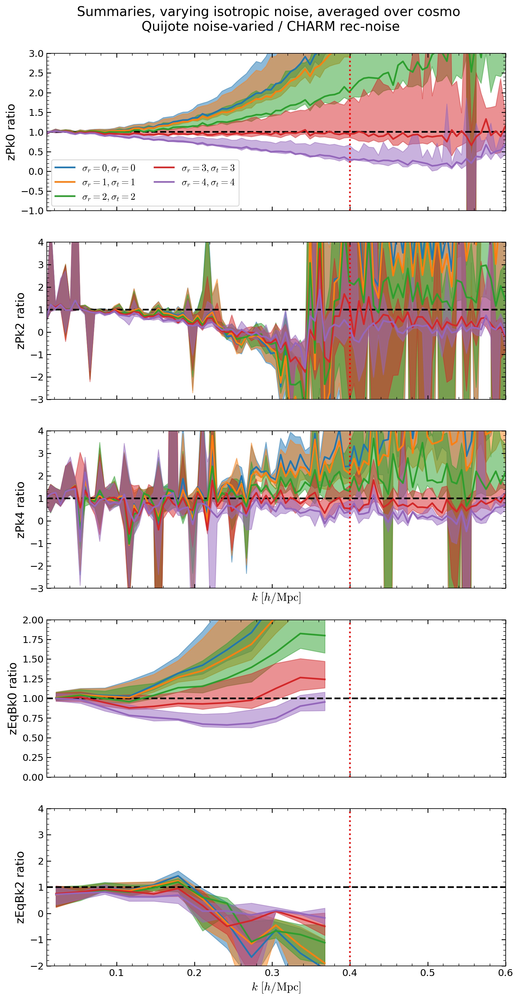

In [27]:
f, axs = plt.subplots(5, 1, figsize=(10, 20), sharex=True)

sigplot = [(i, i) for i in range(5)]

ax = axs[0]
ax.axhline(1, color='k', ls='--')
for i, (sigrad, sigtran) in enumerate(sigplot):
    qrecord = qrecords[(sigrad, sigtran)]
    xs = []
    for lhid in lhidlist[1:]:
        data = record[lhid]
        qdata = qrecord[lhid]
        x = (qdata['zPk'][:, 0] - 1/qdata['nbar']) / \
            (data['zPk'][:, 0] - 1/data['nbar'])
        xs.append(x)
    percs = np.percentile(xs, [16, 50, 84], axis=0)
    ax.fill_between(data['zPk_k3D'], percs[0], percs[2],
                    color=f'C{i}', alpha=0.5)
    ax.plot(data['zPk_k3D'], percs[1], color=f'C{i}', lw=2,
            label=f'$\sigma_r={sigrad}, \sigma_t={sigtran}$')
ax.set_ylabel('zPk0 ratio')
ax.axvline(kmax, color='r', ls=':')
ax.set_ylim(-1., 3)
ax.legend(ncol=2)

ax = axs[1]
ax.axhline(1, color='k', ls='--')
for i, (sigrad, sigtran) in enumerate(sigplot):
    qrecord = qrecords[(sigrad, sigtran)]
    xs = []
    for lhid in lhidlist[1:]:
        data = record[lhid]
        qdata = qrecord[lhid]
        x = (qdata['zPk'][:, 1])/(data['zPk'][:, 1])
        xs.append(x)
    percs = np.percentile(xs, [16, 50, 84], axis=0)
    ax.fill_between(data['zPk_k3D'], percs[0], percs[2],
                    color=f'C{i}', alpha=0.5)
    ax.plot(data['zPk_k3D'], percs[1], color=f'C{i}', lw=2)
ax.set_ylabel('zPk2 ratio')
ax.axvline(kmax, color='r', ls=':')
ax.set_ylim(-3, 4)


ax = axs[2]
ax.axhline(1, color='k', ls='--')
for i, (sigrad, sigtran) in enumerate(sigplot):
    qrecord = qrecords[(sigrad, sigtran)]
    xs = []
    for lhid in lhidlist[1:]:
        data = record[lhid]
        qdata = qrecord[lhid]
        x = (qdata['zPk'][:, 2])/(data['zPk'][:, 2])
        xs.append(x)
    percs = np.percentile(xs, [16, 50, 84], axis=0)
    ax.fill_between(data['zPk_k3D'], percs[0], percs[2],
                    color=f'C{i}', alpha=0.5)
    ax.plot(data['zPk_k3D'], percs[1], color=f'C{i}', lw=2)
ax.set_ylabel('zPk4 ratio')
ax.set_xlabel(r'$k\ [h/\mathrm{Mpc}]$')
ax.axvline(kmax, color='r', ls=':')
ax.set_ylim(-3, 4)


ax = axs[3]
ax.axhline(1, color='k', ls='--')
for i, (sigrad, sigtran) in enumerate(sigplot):
    qrecord = qrecords[(sigrad, sigtran)]
    xs = []
    for lhid in lhidlist[1:]:
        data = record[lhid]
        qdata = qrecord[lhid]
        x = (qdata['zEqBk'][0])/(data['zEqBk'][0])
        xs.append(x)
    percs = np.percentile(xs, [16, 50, 84], axis=0)
    ax.fill_between(data['zEqBk_k123'][0], percs[0], percs[2],
                    color=f'C{i}', alpha=0.5)
    ax.plot(data['zEqBk_k123'][0], percs[1], color=f'C{i}', lw=2)
ax.set_ylabel('zEqBk0 ratio')
ax.axvline(kmax, color='r', ls=':')
ax.set_ylim(0., 2.)

ax = axs[4]
ax.axhline(1, color='k', ls='--')
for i, (sigrad, sigtran) in enumerate(sigplot):
    qrecord = qrecords[(sigrad, sigtran)]
    xs = []
    for lhid in lhidlist[1:]:
        data = record[lhid]
        qdata = qrecord[lhid]
        x = (qdata['zEqBk'][1])/(data['zEqBk'][1])
        xs.append(x)
    percs = np.percentile(xs, [16, 50, 84], axis=0)
    ax.fill_between(data['zEqBk_k123'][1], percs[0], percs[2],
                    color=f'C{i}', alpha=0.5)
    ax.plot(data['zEqBk_k123'][1], percs[1], color=f'C{i}', lw=2)
ax.set_ylabel('zEqBk2 ratio')
ax.set_xlabel(r'$k\ [h/\mathrm{Mpc}]$')
ax.set_xlim(0.01, 0.6)
ax.axvline(kmax, color='r', ls=':')
ax.set_ylim(-2, 4)
# ax.semilogx()

plt.suptitle(f'Summaries, varying isotropic noise, averaged over cosmo'
             f'\n Quijote noise-varied / CHARM rec-noise',
             fontsize=16, y=0.92)

Text(0.5, 0.92, 'Summaries, varying transverse noise, averaged over cosmo\n Quijote noise-varied / CHARM rec-noise')

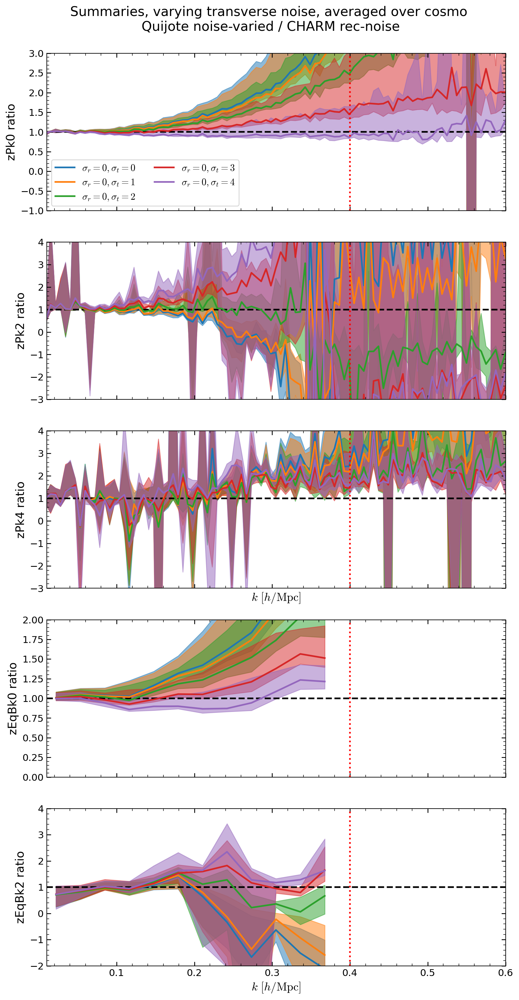

In [28]:
f, axs = plt.subplots(5, 1, figsize=(10, 20), sharex=True)

sigplot = [(0, i) for i in range(5)]

ax = axs[0]
ax.axhline(1, color='k', ls='--')
for i, (sigrad, sigtran) in enumerate(sigplot):
    qrecord = qrecords[(sigrad, sigtran)]
    xs = []
    for lhid in lhidlist[1:]:
        data = record[lhid]
        qdata = qrecord[lhid]
        x = (qdata['zPk'][:, 0] - 1/qdata['nbar']) / \
            (data['zPk'][:, 0] - 1/data['nbar'])
        xs.append(x)
    percs = np.percentile(xs, [16, 50, 84], axis=0)
    ax.fill_between(data['zPk_k3D'], percs[0], percs[2],
                    color=f'C{i}', alpha=0.5)
    ax.plot(data['zPk_k3D'], percs[1], color=f'C{i}', lw=2,
            label=f'$\sigma_r={sigrad}, \sigma_t={sigtran}$')
ax.set_ylabel('zPk0 ratio')
ax.axvline(kmax, color='r', ls=':')
ax.set_ylim(-1., 3)
ax.legend(ncol=2)

ax = axs[1]
ax.axhline(1, color='k', ls='--')
for i, (sigrad, sigtran) in enumerate(sigplot):
    qrecord = qrecords[(sigrad, sigtran)]
    xs = []
    for lhid in lhidlist[1:]:
        data = record[lhid]
        qdata = qrecord[lhid]
        x = (qdata['zPk'][:, 1])/(data['zPk'][:, 1])
        xs.append(x)
    percs = np.percentile(xs, [16, 50, 84], axis=0)
    ax.fill_between(data['zPk_k3D'], percs[0], percs[2],
                    color=f'C{i}', alpha=0.5)
    ax.plot(data['zPk_k3D'], percs[1], color=f'C{i}', lw=2)
ax.set_ylabel('zPk2 ratio')
ax.axvline(kmax, color='r', ls=':')
ax.set_ylim(-3, 4)


ax = axs[2]
ax.axhline(1, color='k', ls='--')
for i, (sigrad, sigtran) in enumerate(sigplot):
    qrecord = qrecords[(sigrad, sigtran)]
    xs = []
    for lhid in lhidlist[1:]:
        data = record[lhid]
        qdata = qrecord[lhid]
        x = (qdata['zPk'][:, 2])/(data['zPk'][:, 2])
        xs.append(x)
    percs = np.percentile(xs, [16, 50, 84], axis=0)
    ax.fill_between(data['zPk_k3D'], percs[0], percs[2],
                    color=f'C{i}', alpha=0.5)
    ax.plot(data['zPk_k3D'], percs[1], color=f'C{i}', lw=2)
ax.set_ylabel('zPk4 ratio')
ax.set_xlabel(r'$k\ [h/\mathrm{Mpc}]$')
ax.axvline(kmax, color='r', ls=':')
ax.set_ylim(-3, 4)


ax = axs[3]
ax.axhline(1, color='k', ls='--')
for i, (sigrad, sigtran) in enumerate(sigplot):
    qrecord = qrecords[(sigrad, sigtran)]
    xs = []
    for lhid in lhidlist[1:]:
        data = record[lhid]
        qdata = qrecord[lhid]
        x = (qdata['zEqBk'][0])/(data['zEqBk'][0])
        xs.append(x)
    percs = np.percentile(xs, [16, 50, 84], axis=0)
    ax.fill_between(data['zEqBk_k123'][0], percs[0], percs[2],
                    color=f'C{i}', alpha=0.5)
    ax.plot(data['zEqBk_k123'][0], percs[1], color=f'C{i}', lw=2)
ax.set_ylabel('zEqBk0 ratio')
ax.axvline(kmax, color='r', ls=':')
ax.set_ylim(0., 2.)

ax = axs[4]
ax.axhline(1, color='k', ls='--')
for i, (sigrad, sigtran) in enumerate(sigplot):
    qrecord = qrecords[(sigrad, sigtran)]
    xs = []
    for lhid in lhidlist[1:]:
        data = record[lhid]
        qdata = qrecord[lhid]
        x = (qdata['zEqBk'][1])/(data['zEqBk'][1])
        xs.append(x)
    percs = np.percentile(xs, [16, 50, 84], axis=0)
    ax.fill_between(data['zEqBk_k123'][1], percs[0], percs[2],
                    color=f'C{i}', alpha=0.5)
    ax.plot(data['zEqBk_k123'][1], percs[1], color=f'C{i}', lw=2)
ax.set_ylabel('zEqBk2 ratio')
ax.set_xlabel(r'$k\ [h/\mathrm{Mpc}]$')
ax.set_xlim(0.01, 0.6)
ax.axvline(kmax, color='r', ls=':')
ax.set_ylim(-2, 4)
# ax.semilogx()

plt.suptitle(f'Summaries, varying transverse noise, averaged over cosmo'
             f'\n Quijote noise-varied / CHARM rec-noise',
             fontsize=16, y=0.92)

Text(0.5, 0.92, 'Summaries, varying radial noise, averaged over cosmo\n Quijote noise-varied / CHARM rec-noise')

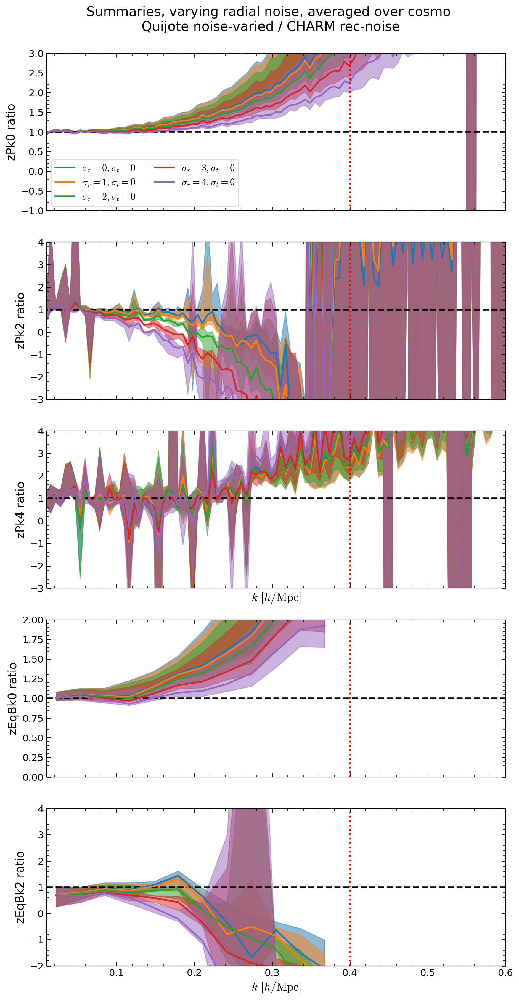

In [29]:
f, axs = plt.subplots(5, 1, figsize=(10, 20), sharex=True)

sigplot = [(i, 0) for i in range(5)]

ax = axs[0]
ax.axhline(1, color='k', ls='--')
for i, (sigrad, sigtran) in enumerate(sigplot):
    qrecord = qrecords[(sigrad, sigtran)]
    xs = []
    for lhid in lhidlist[1:]:
        data = record[lhid]
        qdata = qrecord[lhid]
        x = (qdata['zPk'][:, 0] - 1/qdata['nbar']) / \
            (data['zPk'][:, 0] - 1/data['nbar'])
        xs.append(x)
    percs = np.percentile(xs, [16, 50, 84], axis=0)
    ax.fill_between(data['zPk_k3D'], percs[0], percs[2],
                    color=f'C{i}', alpha=0.5)
    ax.plot(data['zPk_k3D'], percs[1], color=f'C{i}', lw=2,
            label=f'$\sigma_r={sigrad}, \sigma_t={sigtran}$')
ax.set_ylabel('zPk0 ratio')
ax.axvline(kmax, color='r', ls=':')
ax.set_ylim(-1., 3)
ax.legend(ncol=2)

ax = axs[1]
ax.axhline(1, color='k', ls='--')
for i, (sigrad, sigtran) in enumerate(sigplot):
    qrecord = qrecords[(sigrad, sigtran)]
    xs = []
    for lhid in lhidlist[1:]:
        data = record[lhid]
        qdata = qrecord[lhid]
        x = (qdata['zPk'][:, 1])/(data['zPk'][:, 1])
        xs.append(x)
    percs = np.percentile(xs, [16, 50, 84], axis=0)
    ax.fill_between(data['zPk_k3D'], percs[0], percs[2],
                    color=f'C{i}', alpha=0.5)
    ax.plot(data['zPk_k3D'], percs[1], color=f'C{i}', lw=2)
ax.set_ylabel('zPk2 ratio')
ax.axvline(kmax, color='r', ls=':')
ax.set_ylim(-3, 4)


ax = axs[2]
ax.axhline(1, color='k', ls='--')
for i, (sigrad, sigtran) in enumerate(sigplot):
    qrecord = qrecords[(sigrad, sigtran)]
    xs = []
    for lhid in lhidlist[1:]:
        data = record[lhid]
        qdata = qrecord[lhid]
        x = (qdata['zPk'][:, 2])/(data['zPk'][:, 2])
        xs.append(x)
    percs = np.percentile(xs, [16, 50, 84], axis=0)
    ax.fill_between(data['zPk_k3D'], percs[0], percs[2],
                    color=f'C{i}', alpha=0.5)
    ax.plot(data['zPk_k3D'], percs[1], color=f'C{i}', lw=2)
ax.set_ylabel('zPk4 ratio')
ax.set_xlabel(r'$k\ [h/\mathrm{Mpc}]$')
ax.axvline(kmax, color='r', ls=':')
ax.set_ylim(-3, 4)


ax = axs[3]
ax.axhline(1, color='k', ls='--')
for i, (sigrad, sigtran) in enumerate(sigplot):
    qrecord = qrecords[(sigrad, sigtran)]
    xs = []
    for lhid in lhidlist[1:]:
        data = record[lhid]
        qdata = qrecord[lhid]
        x = (qdata['zEqBk'][0])/(data['zEqBk'][0])
        xs.append(x)
    percs = np.percentile(xs, [16, 50, 84], axis=0)
    ax.fill_between(data['zEqBk_k123'][0], percs[0], percs[2],
                    color=f'C{i}', alpha=0.5)
    ax.plot(data['zEqBk_k123'][0], percs[1], color=f'C{i}', lw=2)
ax.set_ylabel('zEqBk0 ratio')
ax.axvline(kmax, color='r', ls=':')
ax.set_ylim(0., 2.)

ax = axs[4]
ax.axhline(1, color='k', ls='--')
for i, (sigrad, sigtran) in enumerate(sigplot):
    qrecord = qrecords[(sigrad, sigtran)]
    xs = []
    for lhid in lhidlist[1:]:
        data = record[lhid]
        qdata = qrecord[lhid]
        x = (qdata['zEqBk'][1])/(data['zEqBk'][1])
        xs.append(x)
    percs = np.percentile(xs, [16, 50, 84], axis=0)
    ax.fill_between(data['zEqBk_k123'][1], percs[0], percs[2],
                    color=f'C{i}', alpha=0.5)
    ax.plot(data['zEqBk_k123'][1], percs[1], color=f'C{i}', lw=2)
ax.set_ylabel('zEqBk2 ratio')
ax.set_xlabel(r'$k\ [h/\mathrm{Mpc}]$')
ax.set_xlim(0.01, 0.6)
ax.axvline(kmax, color='r', ls=':')
ax.set_ylim(-2, 4)
# ax.semilogx()

plt.suptitle(f'Summaries, varying radial noise, averaged over cosmo'
             f'\n Quijote noise-varied / CHARM rec-noise',
             fontsize=16, y=0.92)

## Check inference preprocessing

In [ ]:
from copy import deepcopy

summaries = 'zBk0+zBk2'
summaries = 'nbar+zPk0+zPk2+zPk4+zBk0+zBk2'
summaries = 'nbar+zPk0+zPk2+zPk4+zBk0+zBk2+zQk0+zQk2'

dirpath = f'/anvil/scratch/x-mho1/cmass-ili/quijote/nbody/models/galaxy/{summaries}/kmin-0.0_kmax-0.4'

filepath = join(dirpath, 'x_train.npy')
x = np.load(filepath)

filepath = join(dirpath, 'x_startidx.txt')
with open(filepath, 'r') as f:
    labels = f.readline().strip().split(',')
    startidx = f.readline().strip().split(',')
    startidx = [int(i) for i in startidx]

y = deepcopy(x)
y -= np.mean(y, axis=0)
y /= np.std(y, axis=0)

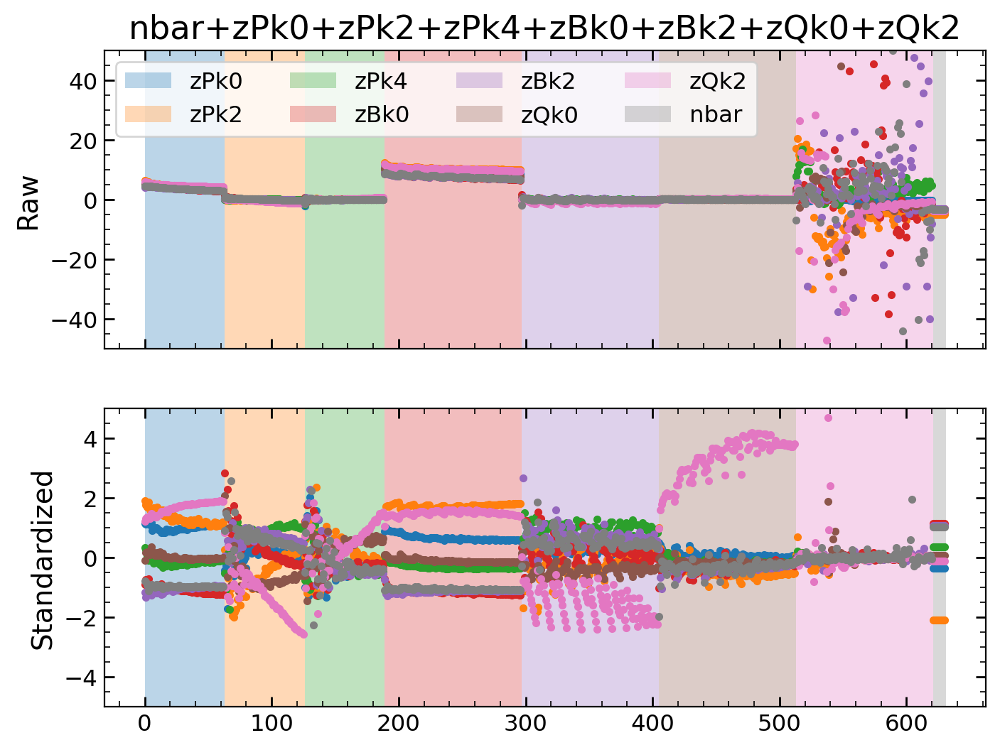

In [ ]:
f, axs = plt.subplots(2, 1, figsize=(8, 6), sharex=True)
axs = axs.flatten()

ax = axs[0]
for i in range(0, len(x), 50):
    ax.plot(x[i], '.')
ax.set_ylabel('Raw')
ax.set_title(summaries)
ax.set_ylim(-50, 50)
for i in range(len(startidx)-1):
    ax.fill_betweenx(
        [-100, 100], startidx[i], startidx[i+1],
        label=labels[i], alpha=0.3
    )
ax.legend(ncol=4)

ax = axs[1]
for i in range(0, len(y), 50):
    ax.plot(y[i], '.')
ax.set_ylabel('Standardized')
ax.set_ylim(-5, 5)
for i in range(len(startidx)-1):
    ax.fill_betweenx(
        [-100, 100], startidx[i], startidx[i+1],
        label=labels[i], alpha=0.3
    )

(-5.0, 5.0)

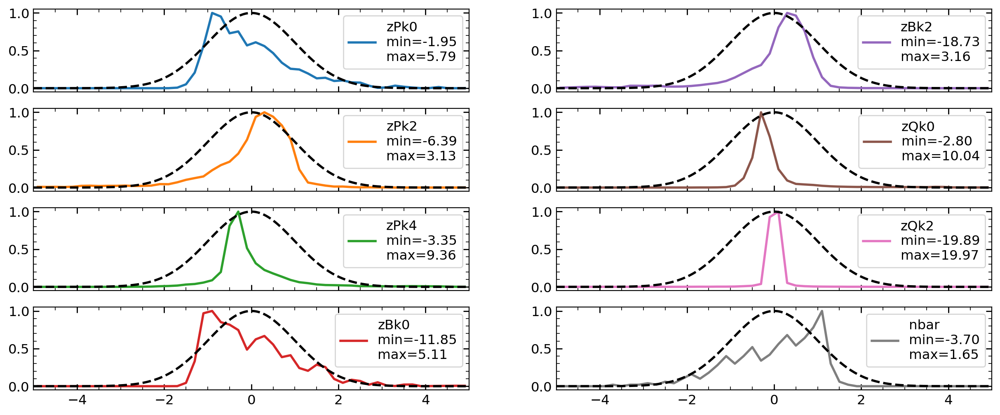

In [ ]:
from scipy.stats import norm
f, axs = plt.subplots(4, 2, figsize=(15, 6), sharex=True)
axs = axs.T.flatten()

_x = np.linspace(-5, 5, 1000)
_y = norm.pdf(_x, loc=0, scale=1)
_y /= np.max(_y)
# ax.semilogy()
be = np.linspace(-5, 5, 51)
for i in range(len(startidx)-1):
    ax = axs[i]
    ysub = y[:, startidx[i]:startidx[i+1]]
    minmax = np.min(ysub), np.max(ysub)
    h, be = np.histogram(ysub.flatten(), bins=be)
    h = h.astype(np.float32)
    h /= np.max(h)
    bcenters = 0.5 * (be[1:] + be[:-1])
    ax.plot(bcenters, h,
            label=f'{labels[i]}\nmin={minmax[0]:.2f}\nmax={minmax[1]:.2f}', c=f'C{i}')
    ax.plot(_x, _y, c='k', ls='--')
    ax.legend()
ax.set_xlim(-5, 5)

In [45]:
diagfile = '/anvil/scratch/x-mho1/cmass-ili/quijote/nbody/L1000-N128/0/diag/galaxies/hod00001.h5'

attrs = {}
diag = {}
with h5py.File(diagfile, 'r') as f:
    a = '0.666667'
    for k, v in f[a].items():
        diag[k] = v[()]
    for k, v in f[a].attrs.items():
        attrs[k] = v

print(list(attrs.keys()))
print(list(diag.keys()))

['Ngalaxies', 'boxsize', 'high_res', 'log10nbar', 'nbar', 'timestamp']
['Bk', 'Bk_k123', 'Pk', 'Pk_k3D', 'Qk', 'bPk', 'bPk_k3D', 'zBk', 'zBk_k123', 'zPk', 'zPk_k3D', 'zQk', 'zbPk', 'zbPk_k3D']


Text(0, 0.5, '$zQ_2$')

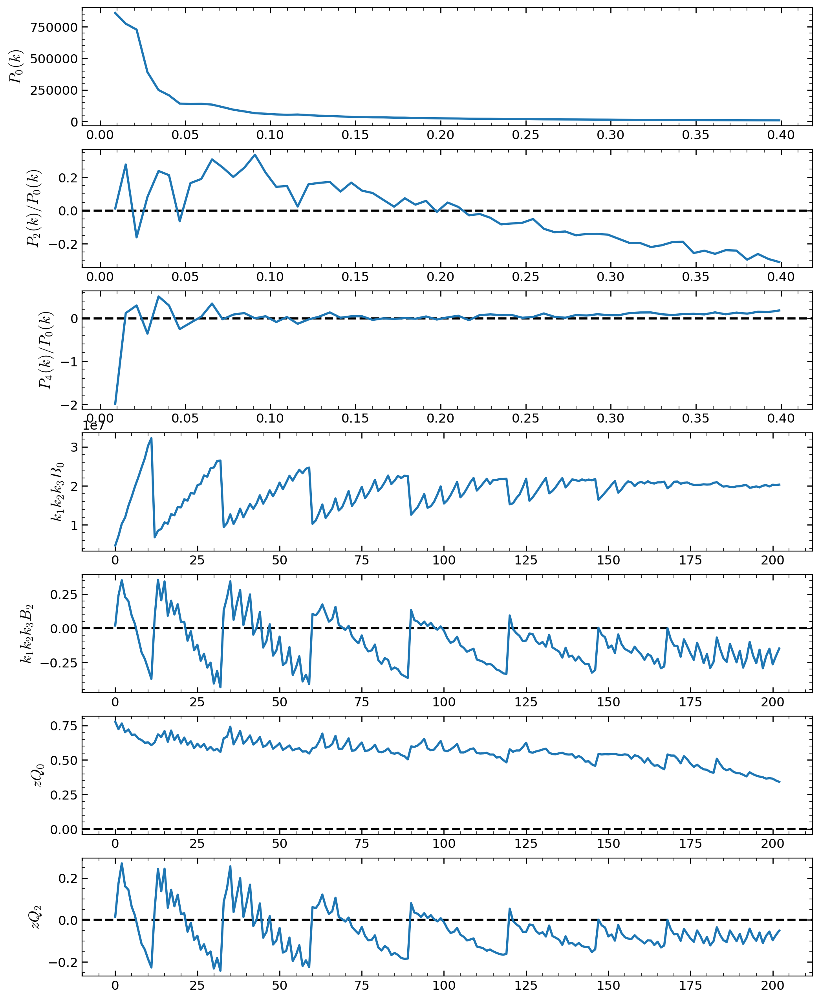

In [56]:
f, axs = plt.subplots(7, 1, figsize=(12, 16))
axs = axs.flatten()

kmin, kmax = 0.0, 0.4

ax = axs[0]
m = (diag['Pk_k3D'] >= kmin) & (diag['Pk_k3D'] <= kmax)
ax.plot(
    diag['Pk_k3D'][m], (diag['zPk'][m, 0]-1/attrs['nbar']), label=r'$\ell=0$')
ax.set_ylabel(r'$P_0(k)$')

ax = axs[1]
ax.axhline(0, color='k', ls='--')
ax.plot(
    diag['Pk_k3D'][m], (diag['zPk'][m, 1]/diag['zPk'][m, 0]), label=r'$\ell=1$')
ax.set_ylabel(r'$P_2(k)/P_0(k)$')

ax = axs[2]
ax.axhline(0, color='k', ls='--')
ax.plot(
    diag['Pk_k3D'][m], (diag['zPk'][m, 2]/diag['zPk'][m, 0]), label=r'$\ell=2$')
ax.set_ylabel(r'$P_4(k)/P_0(k)$')

ax = axs[3]
m = np.all((diag['Bk_k123'] >= kmin) & (diag['Bk_k123'] <= kmax), axis=0)
ax.plot(
    np.prod(diag['Bk_k123'][:, m], axis=0) * diag['zBk'][0, m], label=r'$\ell=0$')
ax.set_ylabel(r'$k_1 k_2 k_3 B_0$')

ax = axs[4]
ax.axhline(0, color='k', ls='--')
ax.plot(
    diag['zBk'][1, m]/diag['zBk'][0, m], label=r'$\ell=2$')
ax.set_ylabel(r'$k_1 k_2 k_3 B_2$')

ax = axs[5]
ax.axhline(0, color='k', ls='--')
ax.plot(
    diag['zQk'][0, m], label=r'$\ell=2$')
ax.set_ylabel(r'$zQ_0$')

ax = axs[6]
ax.axhline(0, color='k', ls='--')
ax.plot(
    diag['zQk'][1, m], label=r'$\ell=2$')
ax.set_ylabel(r'$zQ_2$')

In [34]:
np.abs(diag['zQk'][1, m]) > 10

array([False,  True,  True,  True,  True,  True,  True,  True,  True,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False,  True,
        True, False, False, False, False, False, False, False, False,
        True, False, False, False,  True, False, False,  True, False,
        True,  True,  True,  True,  True,  True, False, False, False,
       False,  True, False, False, False, False,  True,  True,  True,
        True, False,  True,  True, False,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True, False, False, False, False])